In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.insert(1, '/home/jw3514/Work/ASD_Circuits/src')
from ASD_Circuits import *
from tabulate import tabulate

In [2]:
def LoadSA(fname, DIR):
    fin = open(DIR+fname, 'rt')
    max_cohe, max_bias, max_STRs = 0, 0, []
    for l in fin:
        l = l.strip().split()
        cohe = float(l[0])
        bias = float(l[1])
        STRs = l[2].split(",")
        if cohe > max_cohe:
            max_cohe = cohe
            max_bias = bias
            max_STRs = STRs
    return max_cohe, max_bias, max_STRs
def GetData(params, size, DIR):
    tmp_parames = params[params["Size"]==size]
    COHES, CutBias, RealBias, STRS = [],[],[],[]
    for i, row in tmp_parames.iterrows():
        #print(row["fname"], DIR)
        try:
            cohe, real_minbias, STRs = LoadSA(row["fname"], DIR)
        except:
            print("Missing Data: {}".format(row))
            continue
        if cohe == 0:
            continue
        COHES.append(cohe)
        CutBias.append(row["minBias"])
        RealBias.append(real_minbias)
        STRS.append(STRs)
        #print(i, cohe, real_minbias)
    return COHES, CutBias, RealBias, STRS
def normtoUnit(x, xmin, xmax):
    return (x-xmin)/(xmax-xmin)
def searchFil(text, DIR):
    RES = []
    for file in os.listdir(DIR):
        if text in file:
            RES.append(file)
    return RES

In [3]:
def Price(CPU=1, Ram=1, Hours=1, Njob=1):
    return (0.02 * CPU + Ram * 0.0067) * Hours * Njob
Price(Njob=10000, Hours=0.5)

133.5

In [5]:
BiasDF = pd.read_csv("../dat/Unionize_bias/Spark_Meta_EWS.Z2.bias.csv", index_col="STR")
N_positive_STR = BiasDF[BiasDF["EFFECT"]>0].shape[0]
print(N_positive_STR, BiasDF[BiasDF["EFFECT"]>0]["EFFECT"].mean())

121 0.251153809016028


In [6]:
adj_mat = pd.read_csv(ConnFil, index_col=0)
g = LoadConnectome2(adj_mat) # Load Connectiome
for n in g.vs:
    n["bias"] = BiasDF.loc[n["label"], "EFFECT"]
for e in g.es:
    e["w2"] = 1/e["weight"]
EdgeWeightsDict = EdgeDict(g, keyon="label")
str2reg = STR2Region()

##### make job array for ASD circuit search

In [16]:
min_bias = 0.3
start_size = N_positive_STR
target_size = np.arange(5, N_positive_STR, 5)

fout = csv.writer(open("Array_size_biaslim.Around1.txt", 'w'), delimiter=",")
arr = 0
for i, t in enumerate(target_size):
    max_mean_bias = BiasDF.head(t)["EFFECT"].mean()
    bias_constranit_p1 = np.arange(0, 0.2, 0.05)
    bias_constranit_p2 = np.arange(0.2, max_mean_bias, 0.01)
    bias_constranit = np.concatenate((bias_constranit_p1, bias_constranit_p2), axis=0)
    for j, b in enumerate(bias_constranit):
        arr += 1
        #print(t, b)
        fout.writerow([arr, t, round(b, 2)])

In [17]:
bias_constranit

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.21, 0.22, 0.23, 0.24, 0.25])

##### XX

In [7]:
params = pd.read_csv("../dat/Circuits/SA/Array_size_biaslim.Around1.txt", index_col=0, header=None)
params.columns = ["Size", "minBias"]
DIR = "../dat/Circuits/SA/ASD_Opt_Cohe_Z/"
for i, row in params.iterrows():
    for file in os.listdir(DIR):
        if file.startswith("SA.{}.".format(i)):
            #print(file)
            params.loc[i, "fname"] = file

In [8]:
##### Pareto Front Search
All_Sizes = []
All_Cohes = []
All_CutBias = []
All_RealBias = []
All_Index = []

for size in set(params["Size"].values):
    if size > 121:
        continue
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
    All_Sizes.extend([size]*len(COHES))
    All_Cohes.extend(COHES)
    All_CutBias.extend(CutBias)
    All_RealBias.extend(RealBias)
DF = pd.DataFrame(data={"Size":All_Sizes, "Cohe":All_Cohes, "CutBias":All_CutBias,
                       "Bias":All_RealBias})
#DF = DF[(DF["Bias"]>0.2570317434306397) ]

In [9]:
min_cohe = np.min(DF["Cohe"].values)
max_cohe = np.max(DF["Cohe"].values)
min_bias = np.min(DF["Bias"].values)
max_bias = np.max(DF["Bias"].values)
print(min_cohe, max_cohe)
print(min_bias, max_bias)
DF['NormCohe'] = DF['Cohe'].apply(lambda x: normtoUnit(x, min_cohe, max_cohe))
DF['NormBias'] = DF['Bias'].apply(lambda x: normtoUnit(x, min_bias, max_bias))

1.0707894895327095 8.430631030188973
0.20726017674569178 0.48309003544249907


In [10]:
bestpoint = np.array((1, 1))
worstpoint = np.array((0, 0))
max_opt = 0
max_idx = 0
max_size = 0
max_STRs = None
max_cut = 0
for i, row in DF.iterrows():
    cohe, bias = row["NormCohe"], row["NormBias"]
    point = np.array((cohe, bias))
    dist1 = np.sqrt(np.sum(np.square(bestpoint-point)))
    dist2 = np.sqrt(np.sum(np.square(point-worstpoint)))
    opt = dist2/(dist1+dist2)
    #print(point, opt)
    #opt = dist2
    DF.loc[i, "TOPSIS"] = opt
    if opt >= max_opt:
        max_opt = opt
        max_size = row["Size"]
        max_cohe = cohe
        max_bias = bias
        max_cut = row["CutBias"]
        max_idx = i
print(max_idx, max_size, max_opt, (max_cohe, max_bias))
print(DF.loc[max_idx,:])

25 5.0 0.717834042088905 (0.6998556124042481, 0.7365362576130029)
Size        5.000000
Cohe        6.221616
CutBias     0.410000
Bias        0.410419
NormCohe    0.699856
NormBias    0.736536
TOPSIS      0.717834
Name: 25, dtype: float64


In [11]:
f = params[(params["Size"]==max_size)&(params["minBias"]==max_cut)]["fname"].values[0]
best_cohe, best_real_minbias, STRs = LoadSA(f, DIR)
print(best_cohe, best_real_minbias)
print(RegionDistributionsList(STRs))

6.221615898166924 0.4104188686081616
Isocortex	3	Orbital_area_lateral_part; Orbital_area_ventrolateral_part; Infralimbic_area
Thalamus	2	Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus



In [12]:
DF["test1"] = DF["NormCohe"] + DF["NormBias"]
DF["test2"] = DF["NormCohe"] * DF["NormBias"]

In [13]:
DF.sort_values("test1", ascending=False).head(10)

,Size,Cohe,CutBias,Bias,NormCohe,NormBias,TOPSIS,test1,test2
0,5,8.203547,0.00,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124
12,5,8.203547,0.28,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124
17,5,8.203547,0.33,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124
3,5,8.203547,0.15,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124
4,5,8.203547,0.20,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124
5,5,8.203547,0.21,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124
16,5,8.203547,0.32,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124
7,5,8.203547,0.23,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124
8,5,8.203547,0.24,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124
15,5,8.203547,0.31,0.337932,0.969146,0.473741,0.671734,1.442887,0.459124


In [14]:
DF.sort_values("test2", ascending=False).head(10)

,Size,Cohe,CutBias,Bias,NormCohe,NormBias,TOPSIS,test1,test2
25,5,6.221616,0.41,0.410419,0.699856,0.736536,0.717834,1.436392,0.515469
24,5,6.221616,0.40,0.410419,0.699856,0.736536,0.717834,1.436392,0.515469
22,5,6.766016,0.38,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
9,5,6.766016,0.25,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
21,5,6.766016,0.37,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
11,5,6.766016,0.27,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
20,5,6.766016,0.36,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
14,5,6.766016,0.30,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
18,5,6.766016,0.34,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
23,5,6.372460,0.39,0.395649,0.720351,0.682990,0.701335,1.403341,0.491993


In [15]:
DF.sort_values("TOPSIS", ascending=False).head(10)

,Size,Cohe,CutBias,Bias,NormCohe,NormBias,TOPSIS,test1,test2
24,5,6.221616,0.40,0.410419,0.699856,0.736536,0.717834,1.436392,0.515469
25,5,6.221616,0.41,0.410419,0.699856,0.736536,0.717834,1.436392,0.515469
21,5,6.766016,0.37,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
11,5,6.766016,0.27,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
20,5,6.766016,0.36,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
22,5,6.766016,0.38,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
14,5,6.766016,0.30,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
9,5,6.766016,0.25,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
18,5,6.766016,0.34,0.386184,0.773825,0.648675,0.707313,1.422500,0.501961
23,5,6.372460,0.39,0.395649,0.720351,0.682990,0.701335,1.403341,0.491993


##### Mark pareto front line

In [17]:
min_bias = np.min(DF["Bias"].values)
max_bias = np.max(DF["Bias"].values)
print(min_bias, max_bias)
Biases = np.arange(min_bias, max_bias, 0.005)

Front_biases = []
Front_cut_biases = []
Front_cohes = []
Front_sizes = []
Front_indice = []
for bias in Biases:
    tmp_df = DF[DF["Bias"]>bias]
    xx = tmp_df[tmp_df.Cohe == tmp_df.Cohe.max()]
    if xx.index[0] not in Front_indice:
        Front_indice.append(xx.index[0])
        Front_biases.append(xx["Bias"].values[0])
        Front_cohes.append(xx["Cohe"].values[0])
        Front_sizes.append(xx["Size"].values[0])
        Front_cut_biases.append(xx["CutBias"].values[0])
        
dat = []
for i, (cutb, size) in enumerate(zip(Front_cut_biases, Front_sizes)):
    search_text = "keepN_{}-minbias_{}.".format(size, cutb)
    f = searchFil(search_text, DIR)[0]
    cohe, real_minbias, STRs = LoadSA(f, DIR)
    dat.append([size, cohe, real_minbias, RegionDistributionsList(STRs)])
#outDF = pd.DataFrame(data=dat, columns=["Size", "Cohe", "Bias", "STRs"])
#outDF.to_csv("dat/front.circuits.PositiveSTRs.csv")
#print(outDF["Bias"].min())

0.20726017674569178 0.48309003544249907


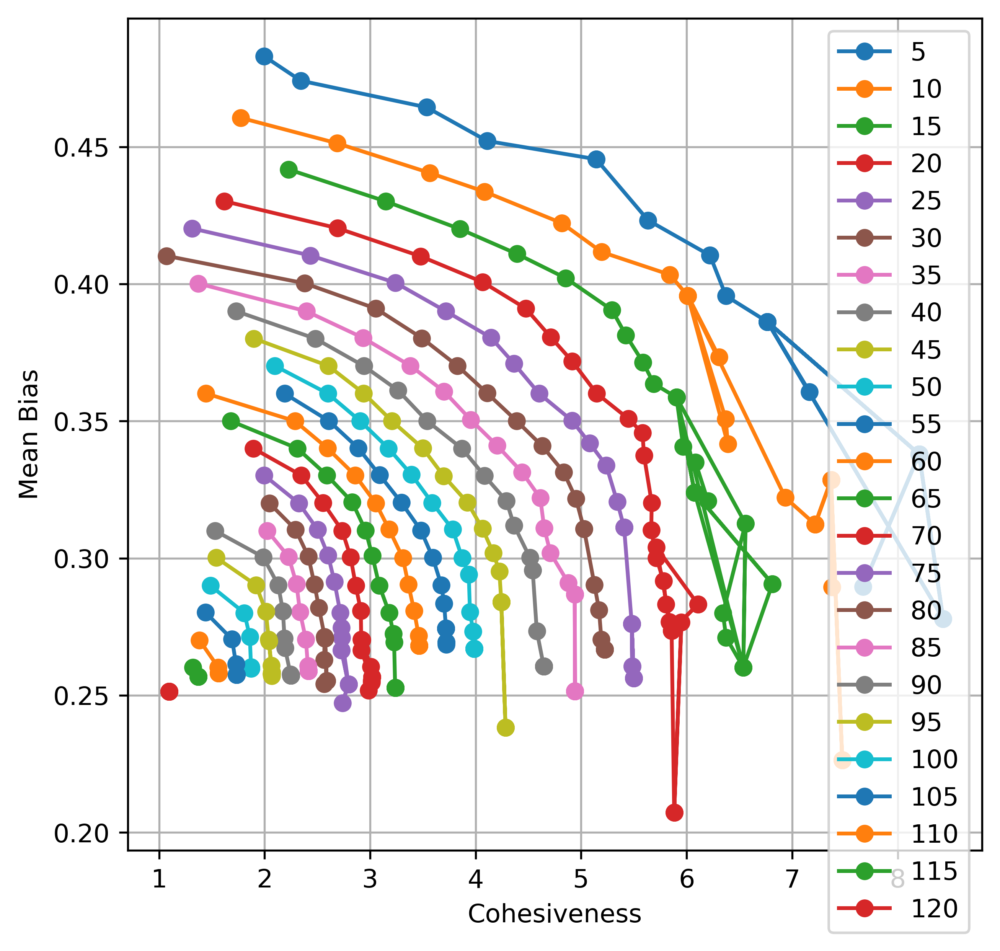

In [31]:
fig, ax = plt.subplots(dpi=480, figsize=(6,6))

for size in set(params["Size"].values):
    #if not( size % 5==0):
    #    continue
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
    max_cohe = np.max(COHES)
    max_bias = np.max(RealBias)
    #line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    
    color = line.get_color()
    line, = ax.plot(COHES, RealBias, 'o-', label="{}".format(size))
    #ax.plot(COHES, CutBias, 'x--', color=color, label="{}".format(size))   \
    #line, = ax.plot(COHES/max_cohe, RealBias/max_bias, 'o-', label="{}".format(size))
    # ax.plot(COHES/max_cohe, CutBias/max_bias, 'x--', color=color, label="{}".format(size))   \

    
ax.legend()
ax.set_xlabel("Cohesiveness")
ax.set_ylabel("Mean Bias")
#ax.set_ylim((0.25, 0.5))
#ax.set_xlim((0.15, 0.65))
#ax.set_xlim((0.35, 0.65))
plt.grid(True)
#plt.savefig("figs/Pareto_minbias_cohe.pdf")

/tmp/ipykernel_234769/3071264460.py:33: RuntimeWarning: invalid value encountered in double_scalars
  return (x-xmin)/(xmax-xmin)


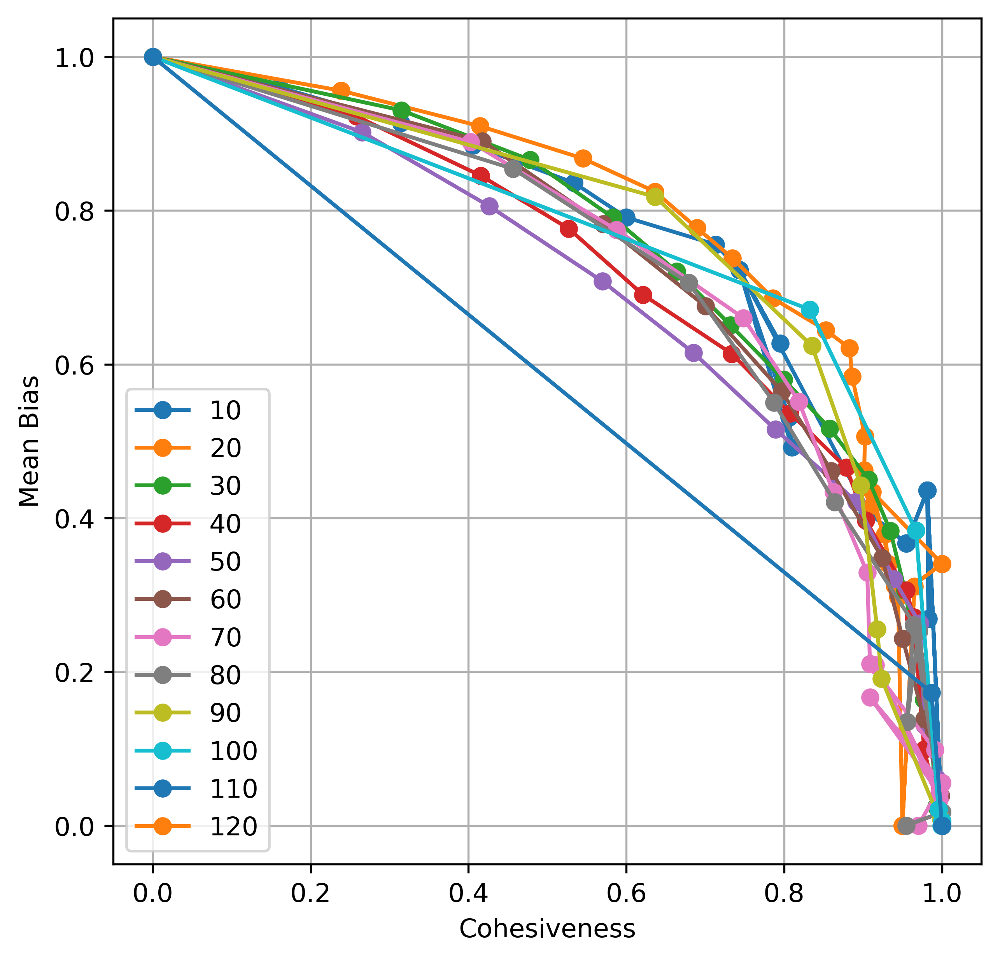

In [40]:
fig, ax = plt.subplots(dpi=480, figsize=(6,6))

for size in set(params["Size"].values):
    if not( size % 10==0):
        continue
    #if not (size > 30 and size < 80):
    #    continue
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
    max_cohe = np.max(COHES)
    min_cohe = np.min(COHES)
    max_bias = np.max(RealBias)
    min_bias = np.min(RealBias)
    #line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    
    color = line.get_color()
    #line, = ax.plot(COHES, RealBias, 'o-')
    #ax.plot(COHES, CutBias, 'x--', color=color, label="{}".format(size))   \
    x = [normtoUnit(x, min_cohe, max_cohe) for x in COHES]
    y = [normtoUnit(y, min_bias, max_bias) for y in RealBias]
    #y = RealBias
    line, = ax.plot(x, y, 'o-', label="{}".format(size))
    #ax.plot(COHES/max_cohe, CutBias/max_bias, 'x--', color=color, label="{}".format(size))   \

#ax.plot(Front_cohes, Front_biases, marker="o", color="black", zorder=100, 
#        label="Pareto Front Line")

#best_cohe = 0.44369921
#best_meanbias = 0.370049218
#best_size = 40
#ax.scatter(best_cohe, best_meanbias, s=80, color="red", 
#          zorder=150, marker="*")
#ax.annotate(xy=(best_cohe+0.01, best_meanbias+0.01), 
#            text="optimal size = {}".format(best_size))
    
ax.legend()
ax.set_xlabel("Cohesiveness")
ax.set_ylabel("Mean Bias")
#ax.set_ylim((0.25, 0.5))
#ax.set_xlim((0.15, 0.65))
#ax.set_xlim((0.35, 0.65))
plt.grid(True)
#plt.savefig("figs/Pareto_minbias_cohe.pdf")

In [25]:
100 * 99 * 98 * 97 * 96 / (1*2*3*4*5)

75287520.0

In [32]:
min_cohe = np.min(outDF["Cohe"].values)
max_cohe = np.max(outDF["Cohe"].values)
min_bias = np.min(outDF["Bias"].values)
max_bias = np.max(outDF["Bias"].values)
print(min_cohe, max_cohe)
print(min_bias, max_bias)
outDF['NormCohe'] = outDF['Cohe'].apply(lambda x: normtoUnit(x, min_cohe, max_cohe))
outDF['NormBias'] = outDF['Bias'].apply(lambda x: normtoUnit(x, min_bias, max_bias))

0.06453632135683489 0.7023362807224531
0.2570317434306397 0.48309003544249907


In [33]:
outDF["Multiply"] = outDF["NormCohe"] * outDF["NormBias"]
outDF["Sum"] = outDF["NormCohe"] + outDF["NormBias"]
outDF.to_csv("dat/front.circuits.PositiveSTRs.csv")

In [34]:
outDF.sort_values("Multiply", ascending=False).head(10)

,Size,Cohe,Bias,STRs,NormCohe,NormBias,Multiply,Sum
12,40,0.443699,0.370049,Cortical_subplate\t2\tClaustrum; Endopiriform_...,0.594486,0.499948,0.297212,1.094434
11,50,0.479656,0.360006,Cortical_subplate\t2\tClaustrum; Endopiriform_...,0.650862,0.455521,0.296481,1.106383
13,35,0.405182,0.380113,Cortical_subplate\t2\tClaustrum; Endopiriform_...,0.534096,0.544466,0.290797,1.078562
10,55,0.512680,0.350063,Cortical_subplate\t3\tClaustrum; Endopiriform_...,0.702640,0.411537,0.289162,1.114177
14,30,0.372777,0.390421,Cortical_subplate\t2\tClaustrum; Endopiriform_...,0.483287,0.590066,0.285171,1.073353
9,60,0.547062,0.340172,Cortical_subplate\t3\tClaustrum; Endopiriform_...,0.756547,0.367782,0.278244,1.124328
15,20,0.335648,0.401375,Cortical_subplate\t2\tClaustrum; Endopiriform_...,0.425073,0.638523,0.271419,1.063596
8,65,0.578453,0.330187,Cortical_subplate\t3\tClaustrum; Endopiriform_...,0.805765,0.323612,0.260755,1.129377
16,20,0.298197,0.411725,Cortical_subplate\t2\tClaustrum; Endopiriform_...,0.366354,0.684306,0.250698,1.050660
7,70,0.604826,0.320039,Cortical_subplate\t3\tClaustrum; Endopiriform_...,0.847115,0.278721,0.236108,1.125835


Text(0, 0.5, 'Norm Bias')

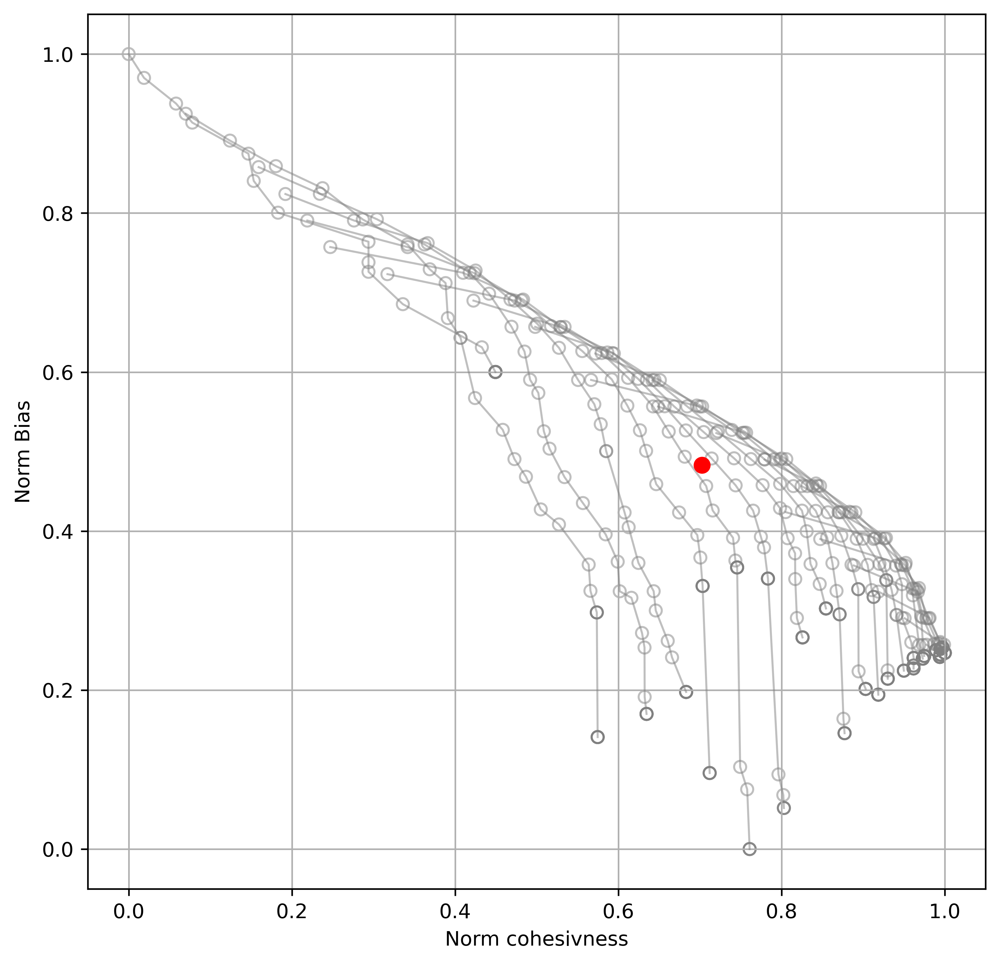

In [35]:
fig, ax = plt.subplots(dpi=480, figsize=(8,8))
sizes = list(set(DF["Size"].values))
for s in sizes:
    tmp_df = DF[DF["Size"]==s]
    ax.scatter(tmp_df["NormCohe"], tmp_df["NormBias"], facecolors='none', 
               edgecolors='grey', 
               alpha=0.5)
    ax.plot(tmp_df["NormCohe"], tmp_df["NormBias"], color="grey", alpha=0.5, lw=1)
ax.scatter(max_cohe, max_bias, color="r", marker="o", s=55, zorder=100)
ax.grid(True)
ax.set_xlabel("Norm cohesivness")
ax.set_ylabel("Norm Bias")

### Some Test

In [862]:
STRs, cohe = GredyTrimFixSize(BiasDF, g, 90, 0, EdgeWeightsDict, start_size=213)
print(cohe, )
#print(STRs)

0.816386415201286


In [10]:
STRs, cohe = GredyTrimFixSize(BiasDF, g, 30, 0, EdgeWeightsDict, start_size=90)
meanbias = BiasDF.loc[STRs, "EFFECT"].mean()
print(cohe, meanbias)
print(STRs)

0.4921894283898788 0.35766888601755725
{'Anteromedial_nucleus_dorsal_part', 'Taenia_tecta', 'Agranular_insular_area_posterior_part', 'Substantia_innominata', 'Nucleus_of_reuniens', 'Infralimbic_area', 'Intercalated_amygdalar_nucleus', 'Orbital_area_ventrolateral_part', 'Endopiriform_nucleus_ventral_part', 'Agranular_insular_area_dorsal_part', 'Piriform_area', 'Orbital_area_medial_part', 'Entorhinal_area_lateral_part', 'Anterior_olfactory_nucleus', 'Agranular_insular_area_ventral_part', 'Mediodorsal_nucleus_of_thalamus', 'Submedial_nucleus_of_the_thalamus', 'Orbital_area_lateral_part', 'Paraventricular_nucleus_of_the_thalamus', 'Olfactory_tubercle', 'Prelimbic_area', 'Claustrum', 'Postpiriform_transition_area', 'Basolateral_amygdalar_nucleus', 'Dorsal_peduncular_area', 'Nucleus_accumbens', 'Endopiriform_nucleus_dorsal_part', 'Piriform_amygdalar_area', 'Frontal_pole_cerebral_cortex', 'Anterior_cingulate_area_dorsal_part'}


In [11]:
STRs, cohe = GredyTrimFixSize(BiasDF, g, 30, 0, EdgeWeightsDict, start_size=80)
meanbias = BiasDF.loc[STRs, "EFFECT"].mean()
print(cohe, meanbias)
print(STRs)

0.47828711992880674 0.3767741585561926
{'Anteromedial_nucleus_dorsal_part', 'Posterolateral_visual_area', 'Nucleus_of_reuniens', 'Infralimbic_area', 'Orbital_area_ventrolateral_part', 'Posterior_parietal_association_areas', 'Agranular_insular_area_dorsal_part', 'Orbital_area_medial_part', 'Entorhinal_area_lateral_part', 'Agranular_insular_area_ventral_part', 'Parataenial_nucleus', 'Anteromedial_nucleus_ventral_part', 'Mediodorsal_nucleus_of_thalamus', 'Submedial_nucleus_of_the_thalamus', 'Retrosplenial_area_dorsal_part', 'Orbital_area_lateral_part', 'Anterior_cingulate_area_ventral_part', 'Prelimbic_area', 'Claustrum', 'Secondary_motor_area', 'Basolateral_amygdalar_nucleus', 'posteromedial_visual_area', 'Anterolateral_visual_area', 'Retrosplenial_area_lateral_agranular_part', 'Dorsal_peduncular_area', 'Primary_visual_area', 'Anteromedial_visual_area', 'Frontal_pole_cerebral_cortex', 'Anterior_cingulate_area_dorsal_part', 'Lateral_visual_area'}


In [12]:
STRs, cohe = GredyTrimFixSize(BiasDF, g, 30, 0, EdgeWeightsDict, start_size=70)
meanbias = BiasDF.loc[STRs, "EFFECT"].mean()
print(cohe, meanbias)
print(STRs)

0.4343126099509694 0.3978813796128545
{'Anteromedial_nucleus_dorsal_part', 'Claustrum', 'Nucleus_of_reuniens', 'Subiculum_dorsal_part', 'Mediodorsal_nucleus_of_thalamus', 'Secondary_motor_area', 'Submedial_nucleus_of_the_thalamus', 'Infralimbic_area', 'Field_CA2', 'Orbital_area_ventrolateral_part', 'Field_CA1', 'Posterior_parietal_association_areas', 'posteromedial_visual_area', 'Retrosplenial_area_lateral_agranular_part', 'Dorsal_peduncular_area', 'Primary_visual_area', 'Field_CA3', 'Orbital_area_lateral_part', 'Anterior_cingulate_area_ventral_part', 'Orbital_area_medial_part', 'Prelimbic_area', 'Anteromedial_visual_area', 'Posterolateral_visual_area', 'Frontal_pole_cerebral_cortex', 'Agranular_insular_area_ventral_part', 'Parataenial_nucleus', 'Anteromedial_nucleus_ventral_part', 'Anterolateral_visual_area', 'Anterior_cingulate_area_dorsal_part', 'Lateral_visual_area'}


In [13]:
STRs, cohe = GredyTrimFixSize(BiasDF, g, 30, 0, EdgeWeightsDict, start_size=60)
meanbias = BiasDF.loc[STRs, "EFFECT"].mean()
print(cohe, meanbias)
print(STRs)

0.4278411320413753 0.4088365594638211
{'Anteromedial_nucleus_dorsal_part', 'Claustrum', 'Nucleus_of_reuniens', 'Subiculum_dorsal_part', 'Mediodorsal_nucleus_of_thalamus', 'Secondary_motor_area', 'Submedial_nucleus_of_the_thalamus', 'Infralimbic_area', 'Field_CA2', 'Orbital_area_ventrolateral_part', 'Field_CA1', 'Posterior_parietal_association_areas', 'posteromedial_visual_area', 'Lateral_posterior_nucleus_of_the_thalamus', 'Retrosplenial_area_lateral_agranular_part', 'Dorsal_peduncular_area', 'Primary_visual_area', 'Field_CA3', 'Orbital_area_lateral_part', 'Anterior_cingulate_area_ventral_part', 'Orbital_area_medial_part', 'Prelimbic_area', 'Anteromedial_visual_area', 'Posterolateral_visual_area', 'Agranular_insular_area_ventral_part', 'Parataenial_nucleus', 'Anterolateral_visual_area', 'Dentate_gyrus', 'Anterior_cingulate_area_dorsal_part', 'Lateral_visual_area'}


In [14]:
STRs, cohe = GredyTrimFixSize(BiasDF, g, 30, 0, EdgeWeightsDict, start_size=50)
meanbias = BiasDF.loc[STRs, "EFFECT"].mean()
print(cohe, meanbias)
print(STRs)

0.3981364637053348 0.41663520842204915
{'Claustrum', 'Nucleus_of_reuniens', 'Subiculum_dorsal_part', 'Mediodorsal_nucleus_of_thalamus', 'Secondary_motor_area', 'Submedial_nucleus_of_the_thalamus', 'Infralimbic_area', 'Field_CA2', 'Lateral_septal_nucleus_caudal_caudodorsal_part', 'Orbital_area_ventrolateral_part', 'Field_CA1', 'Parasubiculum', 'Posterior_parietal_association_areas', 'posteromedial_visual_area', 'Lateral_posterior_nucleus_of_the_thalamus', 'Retrosplenial_area_lateral_agranular_part', 'Dorsal_peduncular_area', 'Primary_visual_area', 'Field_CA3', 'Orbital_area_lateral_part', 'Subiculum_ventral_part', 'Anterior_cingulate_area_ventral_part', 'Orbital_area_medial_part', 'Prelimbic_area', 'Anteromedial_visual_area', 'Agranular_insular_area_ventral_part', 'Parataenial_nucleus', 'Dentate_gyrus', 'Anterior_cingulate_area_dorsal_part', 'Lateral_visual_area'}


In [15]:
STRs, cohe = GredyTrimFixSize(BiasDF, g, 30, 0, EdgeWeightsDict, start_size=40)
meanbias = BiasDF.loc[STRs, "EFFECT"].mean()
print(cohe, meanbias)
print(STRs)

0.2956900652939607 0.4386177393546591
{'Claustrum', 'Nucleus_of_reuniens', 'Mediodorsal_nucleus_of_thalamus', 'Secondary_motor_area', 'Submedial_nucleus_of_the_thalamus', 'Infralimbic_area', 'Field_CA2', 'Orbital_area_ventrolateral_part', 'Field_CA1', 'Caudoputamen', 'Parafascicular_nucleus', 'Lateral_posterior_nucleus_of_the_thalamus', 'Retrosplenial_area_lateral_agranular_part', 'Primary_somatosensory_area_lower_limb', 'Dorsal_peduncular_area', 'Primary_visual_area', 'Field_CA3', 'Gustatory_areas', 'Orbital_area_lateral_part', 'Subiculum_ventral_part', 'Anterior_cingulate_area_ventral_part', 'Orbital_area_medial_part', 'Anterior_olfactory_nucleus', 'Prelimbic_area', 'Endopiriform_nucleus_dorsal_part', 'Anteromedial_visual_area', 'Primary_motor_area', 'Dentate_gyrus', 'Anterior_cingulate_area_dorsal_part', 'Lateral_visual_area'}


In [61]:
def run_CircuitOpt(g, EdgeWeightsDict, BiasDF, weighted=True, directed=False, 
                   topN=100, keepN=30, minbias=-1):
    CandidateNodes = BiasDF.head(topN).index.values
    Init_States = np.ones(len(CandidateNodes))
    for idx in range(len(Init_States)):
        if idx > keepN-1:
            Init_States[idx] = 0
    ins = MostCohesiveCirtuisGivenNCandidates(BiasDF, Init_States, g, CandidateNodes, 
                        EdgeWeightsDict, Weighted=weighted, Direction=directed, minbias=minbias)
    ins.copy_strategy = "deepcopy"
    ins.Tmax=1e-2
    ins.Tmin=5e-5
    Tmps, Energys, state, e = ins.anneal()
    res = CandidateNodes[np.where(state==1)[0]]
    return res

In [19]:
res = run_CircuitOpt(g, EdgeWeightsDict, BiasDF, topN=50, keepN=30)


 Temperature        Energy    Accept   Improve      Steps        Elapsed   Remaining
     0.00005          0.60     0.00%     0.00%      10000.00     0:00:58     0:00:00

In [20]:
cohe, conn = ScoreSTRSet(g, res, WeightDict=EdgeWeightsDict, Weighted=True)
meanbias = BiasDF.loc[res, "EFFECT"].mean()
print(cohe, meanbias)

0.3981364637053348 0.41663520842204904


In [21]:
RegionDistributionsList(res)

Striatum 	 1 	 Lateral_septal_nucleus_caudal_caudodorsal_part
Thalamus 	 5 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus
Hippocampus 	 7 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part
Isocortex 	 15 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; posteromedial_visual_area
Cortical_subplate 	 1 	 Claustrum
Olfactory_areas 	 1 	 Dorsal_peduncular_area


In [22]:
res2 = run_CircuitOpt(g, EdgeWeightsDict, BiasDF, topN=50, keepN=30, minbias=0.42)


 Temperature        Energy    Accept   Improve      Steps        Elapsed   Remaining
     0.00005          0.60     0.00%     0.00%      10000.00     0:01:02     0:00:00

In [23]:
cohe, conn = ScoreSTRSet(g, res2, WeightDict=EdgeWeightsDict, Weighted=True)
meanbias = BiasDF.loc[res2, "EFFECT"].mean()
print(cohe, meanbias)

0.3969246620379629 0.42195776669552887


In [24]:
RegionDistributionsList(res2)

Striatum 	 2 	 Nucleus_accumbens; Lateral_septal_nucleus_caudal_caudodorsal_part
Thalamus 	 4 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus
Hippocampus 	 7 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part
Isocortex 	 15 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; posteromedial_visual_area
Cortical_subplate 	 1 	 Claustrum
Olfactory_areas 	 1 	 Dorsal_peduncular_area


In [25]:
res3 = run_CircuitOpt(g, EdgeWeightsDict, BiasDF, topN=50, keepN=30, minbias=0.425)


 Temperature        Energy    Accept   Improve      Steps        Elapsed   Remaining
     0.00005          0.61     0.00%     0.00%      10000.00     0:01:01     0:00:00

In [26]:
cohe, conn = ScoreSTRSet(g, res3, WeightDict=EdgeWeightsDict, Weighted=True)
meanbias = BiasDF.loc[res3, "EFFECT"].mean()
print(cohe, meanbias)

0.3915652356920611 0.42599718476822834


In [27]:
RegionDistributionsList(res3)

Striatum 	 2 	 Nucleus_accumbens; Lateral_septal_nucleus_caudal_caudodorsal_part
Thalamus 	 4 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus
Hippocampus 	 6 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Subiculum_dorsal_part
Isocortex 	 15 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; posteromedial_visual_area
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Olfactory_areas 	 1 	 Dorsal_peduncular_area


In [28]:
res4 = run_CircuitOpt(g, EdgeWeightsDict, BiasDF, topN=50, keepN=30, minbias=0.43)


 Temperature        Energy    Accept   Improve      Steps        Elapsed   Remaining
     0.00005          0.62     0.00%     0.00%      10000.00     0:01:03     0:00:00

In [29]:
cohe, conn = ScoreSTRSet(g, res4, WeightDict=EdgeWeightsDict, Weighted=True)
meanbias = BiasDF.loc[res4, "EFFECT"].mean()
print(cohe, meanbias)

0.3807321587790981 0.4301208439495116


In [30]:
RegionDistributionsList(res4)

Striatum 	 3 	 Nucleus_accumbens; Lateral_septal_nucleus_rostral_rostroventral_part; Lateral_septal_nucleus_caudal_caudodorsal_part
Thalamus 	 4 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus
Hippocampus 	 7 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part
Isocortex 	 12 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Agranular_insular_area_ventral_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Olfactory_areas 	 2 	 Dorsal_peduncular_area; Anterior_olfactory_nucleus


In [33]:
res5 = run_CircuitOpt(g, EdgeWeightsDict, BiasDF, topN=50, keepN=30, minbias=0.435)


 Temperature        Energy    Accept   Improve      Steps        Elapsed   Remaining
     0.00005          0.63     0.00%     0.00%      10000.00     0:01:11     0:00:00

In [34]:
cohe, conn = ScoreSTRSet(g, res5, WeightDict=EdgeWeightsDict, Weighted=True)
meanbias = BiasDF.loc[res5, "EFFECT"].mean()
print(cohe, meanbias)

0.37177511727195905 0.435302468302573


In [35]:
RegionDistributionsList(res5)

Striatum 	 3 	 Nucleus_accumbens; Caudoputamen; Lateral_septal_nucleus_caudal_caudodorsal_part
Thalamus 	 4 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus
Hippocampus 	 6 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Subiculum_dorsal_part
Isocortex 	 14 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Olfactory_areas 	 1 	 Dorsal_peduncular_area


In [36]:
res6 = run_CircuitOpt(g, EdgeWeightsDict, BiasDF, topN=100, keepN=30, minbias=0.435)


 Temperature        Energy    Accept   Improve      Steps        Elapsed   Remaining
     0.00005          0.62     0.00%     0.00%      10000.00     0:01:45     0:00:00

In [37]:
cohe, conn = ScoreSTRSet(g, res6, WeightDict=EdgeWeightsDict, Weighted=True)
meanbias = BiasDF.loc[res6, "EFFECT"].mean()
print(cohe, meanbias)

0.38409110511736017 0.435600281203097


In [38]:
RegionDistributionsList(res6)

Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 5 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part
Hippocampus 	 7 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part
Isocortex 	 13 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Agranular_insular_area_ventral_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Olfactory_areas 	 1 	 Dorsal_peduncular_area


In [39]:
res7 = run_CircuitOpt(g, EdgeWeightsDict, BiasDF, topN=100, keepN=30, minbias=0.400)


 Temperature        Energy    Accept   Improve      Steps        Elapsed   Remaining
     0.00005          0.54     0.00%     0.00%      10000.00     0:01:10     0:00:00

In [40]:
cohe, conn = ScoreSTRSet(g, res7, WeightDict=EdgeWeightsDict, Weighted=True)
meanbias = BiasDF.loc[res7, "EFFECT"].mean()
print(cohe, meanbias)

0.45699628972228346 0.40070595904047485


In [41]:
RegionDistributionsList(res7)

Striatum 	 1 	 Nucleus_accumbens
Thalamus 	 5 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part
Hippocampus 	 1 	 Entorhinal_area_lateral_part
Isocortex 	 18 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; posteromedial_visual_area; Posterolateral_visual_area; Anterolateral_visual_area; Retrosplenial_area_dorsal_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 2 	 Dorsal_peduncular_area; Anterior_olfactory_nucleus


In [42]:
res8 = run_CircuitOpt(g, EdgeWeightsDict, BiasDF, topN=100, keepN=40, minbias=0.400)


 Temperature        Energy    Accept   Improve      Steps        Elapsed   Remaining
     0.00005          0.52     0.00%     0.00%      10000.00     0:01:31     0:00:00

In [43]:
cohe, conn = ScoreSTRSet(g, res8, WeightDict=EdgeWeightsDict, Weighted=True)
meanbias = BiasDF.loc[res8, "EFFECT"].mean()
print(cohe, meanbias)

0.483763041458127 0.4004662817246751


In [44]:
RegionDistributionsList(res8)

Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 6 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part
Hippocampus 	 7 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Isocortex 	 18 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; posteromedial_visual_area; Posterolateral_visual_area; Anterolateral_visual_area; Frontal_pole_cerebral_cortex
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Amygdalar 	

In [62]:
res8 = run_CircuitOpt(g, EdgeWeightsDict, BiasDF, topN=100, keepN=40, minbias=0.500)


 Temperature        Energy    Accept   Improve      Steps        Elapsed   Remaining
     0.01000          0.73                         0:00:00            

Not Possible with current Max Bias


SystemExit: 

/Users/jiayao/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3275: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [32]:
BiasDF.head(30)["EFFECT"].mean()

0.44640215285165186

### XX

In [47]:
start_size = 100
target_size = np.arange(20, 50, 1)
min_bias = np.arange(0.3, 0.44, 0.01)


In [48]:
min_bias

array([0.3 , 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 ,
       0.41, 0.42, 0.43, 0.44])

In [1035]:
min_bias = 0.3
start_size = 120
target_size = np.arange(5, 121, 1)
min_bias = np.arange(0, 0.44, 0.01)

fout = csv.writer(open("Array_size_biaslim.5-125.txt", 'w'), delimiter=",")
arr = 0
for i, t in enumerate(target_size):
    max_mean_bias = BiasDF.head(t)["EFFECT"].mean()
    bias_constranit = np.arange(min_bias, max_mean_bias, 0.01)
    for j, b in enumerate(bias_constranit):
        arr += 1
        #print(t, b)
        fout.writerow([arr, t, round(b)])

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [180]:
min_bias = 0.3
start_size = 100
target_size = np.arange(5, 20, 1)
#min_bias = np.arange(0.3, 0.44, 0.01)

fout = csv.writer(open("Array_size_biaslim.part2.txt", 'w'), delimiter=",")
arr = 0
for i, t in enumerate(target_size):
    max_mean_bias = BiasDF.head(t)["EFFECT"].mean()
    bias_constranit = np.arange(min_bias, max_mean_bias, 0.01)
    for j, b in enumerate(bias_constranit):
        arr += 1
        #print(t, b)
        fout.writerow([arr, t, round(b, 2)])

In [184]:
min_bias = 0.3
start_size = 100
target_size = np.arange(50, 71, 1)

fout = csv.writer(open("Array_size_biaslim.part3.txt", 'w'), delimiter=",")
arr = 0
for i, t in enumerate(target_size):
    max_mean_bias = BiasDF.head(t)["EFFECT"].mean()
    bias_constranit = np.arange(min_bias, max_mean_bias, 0.01)
    for j, b in enumerate(bias_constranit):
        arr += 1
        #print(t, b)
        fout.writerow([arr, t, round(b, 2)])

In [501]:
params = pd.read_csv("Array_size_biaslim.txt", index_col=0, header=None)
params.columns = ["Size", "minBias"]
params2 = pd.read_csv("Array_size_biaslim.part2.txt", index_col=0, header=None)
params2.columns = ["Size", "minBias"]
params3 = pd.read_csv("Array_size_biaslim.part3.txt", index_col=0, header=None)
params3.columns = ["Size", "minBias"]
params.head(2)

,Size,minBias
0,,
1,20,0.30
2,20,0.31


In [502]:
DIR1 = "/Users/jiayao/Work/ASD_Circuits/src/dat/SA/param_search/"
for i, row in params.iterrows():
    for file in os.listdir(DIR1):
        if file.startswith("SA.{}.".format(i)):
            #print(file)
            params.loc[i, "fname"] = file
DIR2 = "/Users/jiayao/Work/ASD_Circuits/src/dat/SA/param_search2/"
for i, row in params2.iterrows():
    for file in os.listdir(DIR2):
        if file.startswith("SA.{}.".format(i)):
            #print(file)
            params2.loc[i, "fname"] = file
DIR3 = "/Users/jiayao/Work/ASD_Circuits/src/dat/SA/param_search3/"
for i, row in params3.iterrows():
    for file in os.listdir(DIR3):
        if file.startswith("SA.{}.".format(i)):
            #print(file)
            params3.loc[i, "fname"] = file        

In [79]:
params.head(2)

,Size,minBias,fname
0,,,
1,20,0.30,SA.1.topN_100-keepN_20-minbias_0.3.txt
2,20,0.31,SA.2.topN_100-keepN_20-minbias_0.31.txt


In [504]:
def LoadSA(fname, DIR):
    fin = open(DIR+fname, 'rt')
    max_cohe, max_bias, max_STRs = 0, 0, []
    for l in fin:
        l = l.strip().split()
        cohe = float(l[0])
        bias = float(l[1])
        STRs = l[2].split(",")
        if cohe > max_cohe:
            max_cohe = cohe
            max_bias = bias
            max_STRs = STRs
    return max_cohe, max_bias, max_STRs
    
#size_20
def GetData(params, size, DIR):
    tmp_parames = params[params["Size"]==size]
    COHES, CutBias, RealBias, STRS = [],[],[],[]
    for i, row in tmp_parames.iterrows():
        #print(row["fname"], DIR)
        try:
            cohe, real_minbias, STRs = LoadSA(row["fname"], DIR)
        except:
            print("Missing Data: {}".format(row))
            continue
        if cohe == 0:
            continue
        COHES.append(cohe)
        CutBias.append(row["minBias"])
        RealBias.append(real_minbias)
        STRS.append(STRs)
        #print(i, cohe, real_minbias)
    return COHES, CutBias, RealBias, STRS
#LoadSA("SA.89.topN_100-keepN_25-minbias_0.31.txt", DIR)

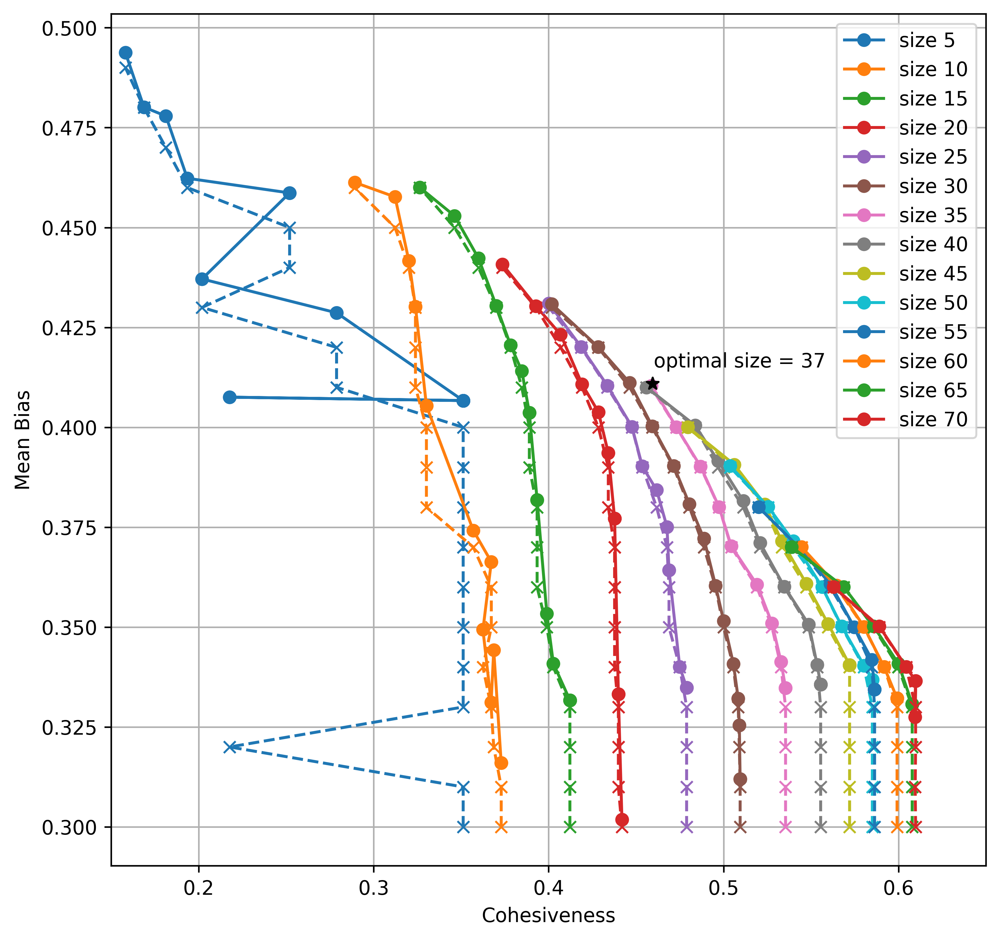

In [505]:
fig, ax = plt.subplots(dpi=480, figsize=(8,8))

for size in set(params2["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params2, size, DIR2)
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)   

for size in set(params["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR1)
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)
    
for size in set(params3["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params3, size, DIR3)
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)
    
ax.scatter(0.4593522981092186, 0.4109094111870745, s=40, color="black", 
          zorder=100, marker="*")
ax.annotate(xy=(0.46,0.415), text="optimal size = 37")
    
ax.legend()
ax.set_xlabel("Cohesiveness")
ax.set_ylabel("Mean Bias")
ax.set_xlim((0.15, 0.65))
#ax.set_xlim((0.35, 0.65))
plt.grid(True)
plt.savefig("figs/Pareto_minbias_cohe.pdf")

In [259]:
np.random.choice(g.vs["label"], 100)

array(['Triangular_nucleus_of_septum',
       'Paraventricular_nucleus_of_the_thalamus', 'Piriform_area',
       'Arcuate_hypothalamic_nucleus', 'Magnocellular_reticular_nucleus',
       'Rhomboid_nucleus', 'Magnocellular_reticular_nucleus',
       'Lateral_habenula', 'Superior_vestibular_nucleus', 'Pyramus_VIII',
       'Lateral_visual_area', 'Nucleus_accumbens', 'Fastigial_nucleus',
       'Triangular_nucleus_of_septum', 'Fundus_of_striatum',
       'Lateral_vestibular_nucleus', 'Fastigial_nucleus', 'Field_CA2',
       'Posterior_amygdalar_nucleus', 'Tegmental_reticular_nucleus',
       'Substantia_nigra_compact_part', 'Posterolateral_visual_area',
       'Periventricular_hypothalamic_nucleus_preoptic_part',
       'Posterior_parietal_association_areas',
       'Tegmental_reticular_nucleus', 'Dorsal_premammillary_nucleus',
       'Medial_geniculate_complex_medial_part',
       'Endopiriform_nucleus_dorsal_part',
       'Ventral_posterolateral_nucleus_of_the_thalamus', 'Prelimbic_area

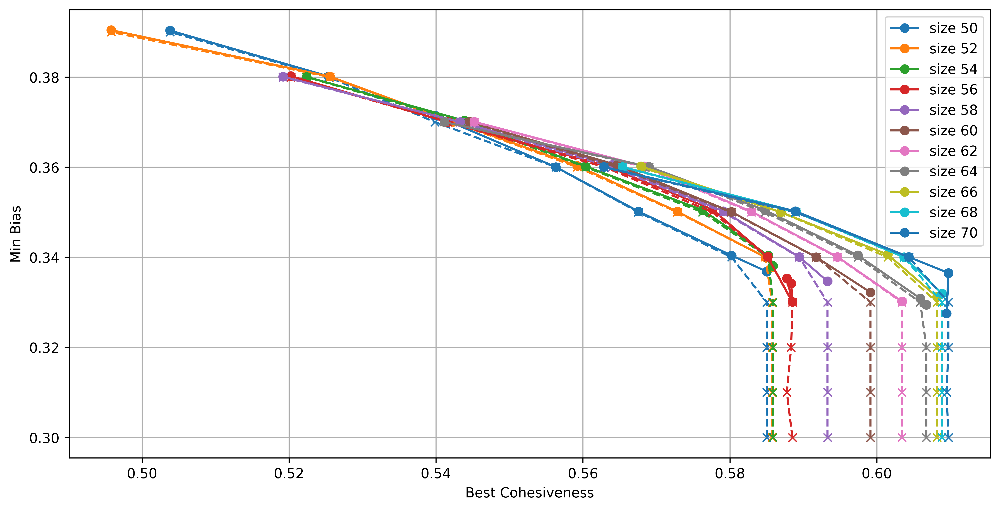

In [250]:
fig, ax = plt.subplots(dpi=480, figsize=(12,6))

for size in set(params3["Size"].values):
    if not( size % 2==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params3, size, DIR3)
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)
    
ax.legend()
ax.set_xlabel("Best Cohesiveness")
ax.set_ylabel("Min Bias")
#ax.set_xlim((0.15, 0.65))
#ax.set_xlim((0.35, 0.65))
plt.grid(True)
plt.savefig("figs/Pareto_minbias_cohe.p3.pdf")

In [242]:
size = 20
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
#idx=0
#print(COHES[idx], CutBias[idx], RealBias[idx])
min_cohe, max_cohe = min(COHES), max(COHES)
min_bias, max_bias = min(RealBias), max(RealBias)
bestpoint = np.array((max_cohe, max_bias))
worstpoint = np.array((min_cohe, min_bias))
max_opt = 0
max_idx = 0
for i, (cohe, bias) in enumerate(zip(COHES, RealBias)):
    point = np.array((cohe, bias))
    dist1 = np.sqrt(np.sum(np.square(bestpoint-point)))
    dist2 = np.sqrt(np.sum(np.square(point-worstpoint)))
    opt = dist2/(dist1+dist2)
    if opt > max_opt:
        max_opt = opt
        max_idx = i
print(max_idx)
RegionDistributionsList(STRS[max_idx])

12
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 4 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Anteromedial_nucleus_dorsal_part
Isocortex 	 10 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 1 	 Dorsal_peduncular_area


In [243]:
size = 30
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
#idx=0
#print(COHES[idx], CutBias[idx], RealBias[idx])
min_cohe, max_cohe = min(COHES), max(COHES)
min_bias, max_bias = min(RealBias), max(RealBias)
bestpoint = np.array((max_cohe, max_bias))
worstpoint = np.array((min_cohe, min_bias))
max_opt = 0
max_idx = 0
for i, (cohe, bias) in enumerate(zip(COHES, RealBias)):
    point = np.array((cohe, bias))
    dist1 = np.sqrt(np.sum(np.square(bestpoint-point)))
    dist2 = np.sqrt(np.sum(np.square(point-worstpoint)))
    #opt = dist2-dist1
    opt = dist2/(dist1+dist2)
    if opt > max_opt:
        max_opt = opt
        max_idx = i
print(max_idx)
RegionDistributionsList(STRS[max_idx])

9
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 7 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Central_medial_nucleus_of_the_thalamus; Paraventricular_nucleus_of_the_thalamus
Hippocampus 	 1 	 Entorhinal_area_lateral_part
Isocortex 	 13 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Gustatory_areas; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 4 	 Dorsal_peduncular_area; Anterior_olfactory_nucleus; Taenia_tecta; Piriform_area


In [241]:
size = 40
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
min_cohe, max_cohe = min(COHES), max(COHES)
min_bias, max_bias = min(RealBias), max(RealBias)
bestpoint = np.array((max_cohe, max_bias))
worstpoint = np.array((min_cohe, min_bias))
max_opt = 0
max_idx = 0
for i, (cohe, bias) in enumerate(zip(COHES, RealBias)):
    point = np.array((cohe, bias))
    dist1 = np.sqrt(np.sum(np.square(bestpoint-point)))
    dist2 = np.sqrt(np.sum(np.square(point-worstpoint)))
    opt = dist2/(dist1+dist2)
    if opt > max_opt:
        max_opt = opt
        max_idx = i
RegionDistributionsList(STRS[max_idx])

Striatum 	 3 	 Nucleus_accumbens; Caudoputamen; Olfactory_tubercle
Thalamus 	 6 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Paraventricular_nucleus_of_the_thalamus
Hippocampus 	 2 	 Subiculum_ventral_part; Entorhinal_area_lateral_part
Pallidum 	 2 	 Bed_nuclei_of_the_stria_terminalis; Substantia_innominata
Isocortex 	 11 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part; Agranular_insular_area_posterior_part
Cortical_subplate 	 3 	 Endopiriform_nucleus_dorsal_part; Claustrum; Endopiriform_nucleus_ventral_part
Amygdalar 	 7 	 Intercalated_amygdalar_nucleus; Basomedial_amygdalar_nucleus; Lateral_amygdalar_nucleus; Basolateral_amygdalar_nucleus; Piriform_amygd

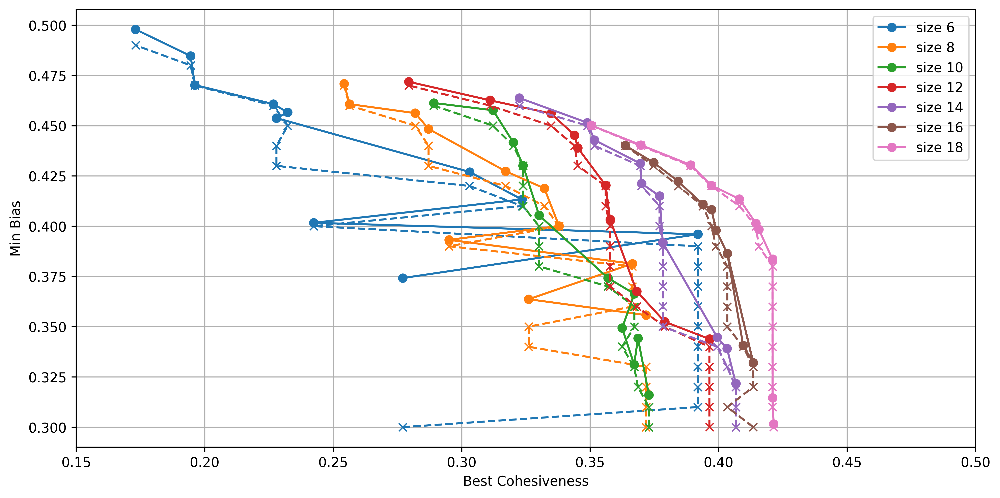

In [201]:
fig, ax = plt.subplots(dpi=480, figsize=(12,6))
for size in set(params2["Size"].values):
    if not( size % 2==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params2, size, DIR2)
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)
ax.legend()
ax.set_xlabel("Best Cohesiveness")
ax.set_ylabel("Min Bias")
ax.set_xlim((0.15, 0.5))
plt.grid(True)
plt.savefig("figs/Pareto_minbias_cohe.p2.pdf")

In [224]:
size = 10
COHES, CutBias, RealBias, STRS = GetData(params2, size, DIR2)
idx=9
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.33014456915207574 0.39 0.405412040271508
Thalamus 	 2 	 Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus
Isocortex 	 7 	 Prelimbic_area; Orbital_area_lateral_part; Orbital_area_ventrolateral_part; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part
Olfactory_areas 	 1 	 Dorsal_peduncular_area


In [216]:
size = 10
COHES, CutBias, RealBias, STRS = GetData(params2, size, DIR2)
idx=10
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.33014456915207574 0.4 0.405412040271508
Thalamus 	 2 	 Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus
Isocortex 	 7 	 Prelimbic_area; Orbital_area_lateral_part; Orbital_area_ventrolateral_part; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part
Olfactory_areas 	 1 	 Dorsal_peduncular_area


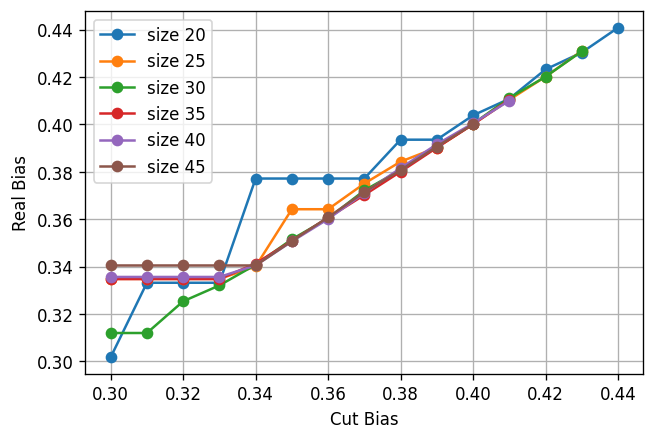

In [111]:
fig, ax = plt.subplots(dpi=120)
for size in set(params["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
    line, = ax.plot(CutBias, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
ax.legend()
ax.set_xlabel("Cut Bias")
ax.set_ylabel("Real Bias")
plt.grid(True)

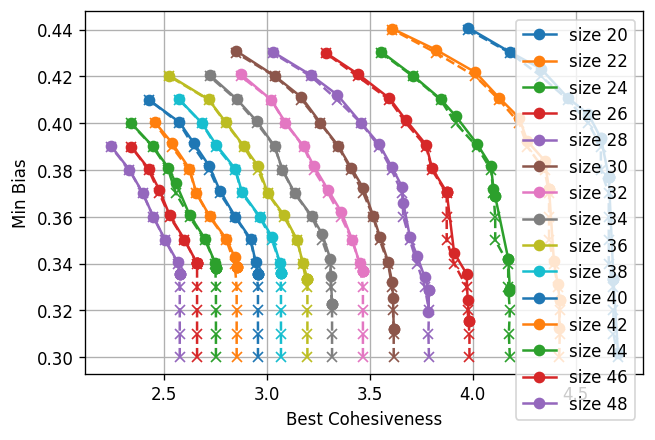

In [125]:
fig, ax = plt.subplots(dpi=120)
for size in set(params["Size"].values):
    if not( size % 2==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
    norm_const = size/213
    COHES = np.array(COHES)/norm_const
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)
ax.legend()
ax.set_xlabel("Best Cohesiveness")
ax.set_ylabel("Min Bias")
plt.grid(True)

In [159]:
size = 48
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=0
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.5809931336033655 0.3 0.335556294996189
Striatum 	 4 	 Nucleus_accumbens; Caudoputamen; Fundus_of_striatum; Olfactory_tubercle
Thalamus 	 11 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Central_medial_nucleus_of_the_thalamus; Anteromedial_nucleus_ventral_part; Rhomboid_nucleus; Ventral_medial_nucleus_of_the_thalamus; Paraventricular_nucleus_of_the_thalamus; Intermediodorsal_nucleus_of_the_thalamus
Hippocampus 	 3 	 Subiculum_ventral_part; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Pallidum 	 2 	 Bed_nuclei_of_the_stria_terminalis; Substantia_innominata
Isocortex 	 12 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Gustatory_areas; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part; Agranular_insu

In [162]:
size = 48
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=9
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.5054208795594687 0.39 0.3904625195905504
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 8 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Central_medial_nucleus_of_the_thalamus; Anteromedial_nucleus_ventral_part
Hippocampus 	 8 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Isocortex 	 23 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Primary_motor_area; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Gustatory_areas; Primary_somatosensory_area_trunk; Posterior_parietal_ass

In [275]:
XX = BiasDF.head(100)
Amy_Cluster = XX[XX["REGION"]=="Amygdalar"].index.values
Hip_Cluster = XX[XX["REGION"]=="Hippocampus"].index.values
Other = XX[~XX["REGION"].isin(["Amygdalar", "Hippocampus"])].index.values[:50]

In [276]:
print(Amy_Cluster, Hip_Cluster)

['Intercalated_amygdalar_nucleus' 'Basomedial_amygdalar_nucleus'
 'Lateral_amygdalar_nucleus' 'Central_amygdalar_nucleus'
 'Basolateral_amygdalar_nucleus' 'Piriform_amygdalar_area'
 'Posterior_amygdalar_nucleus' 'Cortical_amygdalar_area_posterior_part'] ['Field_CA1' 'Dentate_gyrus' 'Subiculum_ventral_part' 'Field_CA2'
 'Field_CA3' 'Parasubiculum' 'Subiculum_dorsal_part' 'Presubiculum'
 'Entorhinal_area_lateral_part' 'Postsubiculum']


In [277]:
ScoreSTRSet(g, Amy_Cluster, WeightDict=EdgeWeightsDict, Weighted=True)

(0.20029478668016037, 28)

In [278]:
ScoreSTRSet(g, Hip_Cluster, WeightDict=EdgeWeightsDict, Weighted=True)

(0.3440684565390817, 40)

In [279]:
xx = np.concatenate((Amy_Cluster, Other))
ScoreSTRSet(g, xx, WeightDict=EdgeWeightsDict, Weighted=True)

(0.42933968879061946, 476)

In [280]:
xx = np.concatenate((Hip_Cluster, Other))
ScoreSTRSet(g, xx, WeightDict=EdgeWeightsDict, Weighted=True)

(0.44491526408771037, 490)

#### some circuits

In [150]:
size = 40
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=5
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.5486929460303834 0.35 0.35064750142720047
Striatum 	 3 	 Nucleus_accumbens; Caudoputamen; Olfactory_tubercle
Thalamus 	 6 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Paraventricular_nucleus_of_the_thalamus
Hippocampus 	 2 	 Subiculum_ventral_part; Entorhinal_area_lateral_part
Pallidum 	 2 	 Bed_nuclei_of_the_stria_terminalis; Substantia_innominata
Isocortex 	 11 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part; Agranular_insular_area_posterior_part
Cortical_subplate 	 3 	 Endopiriform_nucleus_dorsal_part; Claustrum; Endopiriform_nucleus_ventral_part
Amygdalar 	 7 	 Intercalated_amygdalar_nucleus; Basomedial_amygdalar_nucleus; Lateral_amygdalar_nucleus; B

In [149]:
size = 40
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=10
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.483763041458127 0.4000000000000001 0.4004662817246751
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 6 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part
Hippocampus 	 7 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Isocortex 	 18 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; posteromedial_visual_area; Posterolateral_visual_area; Anterolateral_visual_area; Frontal_pole_cerebral_cortex
Cortical_subplate 	 2 	

In [153]:
size = 36
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=10
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.47360197786314107 0.4000000000000001 0.4003579279952255
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 6 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Anteromedial_nucleus_ventral_part
Hippocampus 	 7 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Isocortex 	 14 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 4 	 Dor

In [171]:
size = 32
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=1
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.5209538599242669 0.31 0.3366404065144549
Striatum 	 3 	 Nucleus_accumbens; Fundus_of_striatum; Olfactory_tubercle
Thalamus 	 5 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Paraventricular_nucleus_of_the_thalamus; Intermediodorsal_nucleus_of_the_thalamus
Hippocampus 	 1 	 Entorhinal_area_lateral_part
Pallidum 	 1 	 Substantia_innominata
Isocortex 	 9 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part; Agranular_insular_area_posterior_part
Cortical_subplate 	 3 	 Endopiriform_nucleus_dorsal_part; Claustrum; Endopiriform_nucleus_ventral_part
Amygdalar 	 4 	 Intercalated_amygdalar_nucleus; Basolateral_amygdalar_nucleus; Piriform_amygdalar_area; Cortical_amygdalar_area_posterior_part
Olfactory_areas 	 6 	 Dorsal_peduncular_area; Anterior_olfactory_nucleus; Taenia_tecta; Pir

In [248]:
size = 30
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=9
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.47146025830946076 0.39 0.39036260212838414
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 7 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Central_medial_nucleus_of_the_thalamus; Paraventricular_nucleus_of_the_thalamus
Hippocampus 	 1 	 Entorhinal_area_lateral_part
Isocortex 	 13 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Gustatory_areas; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 4 	 Dorsal_peduncular_area; Anterior_olfactory_nucleus; Taenia_tecta; Piriform_area


In [247]:
size = 30
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=10
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.45921576284225757 0.4000000000000001 0.40026421640529747
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 5 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Anteromedial_nucleus_dorsal_part; Anteromedial_nucleus_ventral_part
Hippocampus 	 6 	 Field_CA1; Dentate_gyrus; Field_CA2; Field_CA3; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Isocortex 	 10 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 4 	 Dorsal_peduncular_area; Anterior_olfactory_nucleus; Taenia_tecta; Piriform_area


In [158]:
size = 20
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=0
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.44189557571383287 0.3 0.30180463577630035
Striatum 	 1 	 Olfactory_tubercle
Thalamus 	 2 	 Nucleus_of_reuniens; Paraventricular_nucleus_of_the_thalamus
Hippocampus 	 1 	 Entorhinal_area_lateral_part
Pallidum 	 1 	 Substantia_innominata
Isocortex 	 1 	 Agranular_insular_area_ventral_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Endopiriform_nucleus_ventral_part
Amygdalar 	 7 	 Intercalated_amygdalar_nucleus; Basomedial_amygdalar_nucleus; Lateral_amygdalar_nucleus; Basolateral_amygdalar_nucleus; Piriform_amygdalar_area; Posterior_amygdalar_nucleus; Cortical_amygdalar_area_posterior_part
Olfactory_areas 	 5 	 Dorsal_peduncular_area; Anterior_olfactory_nucleus; Taenia_tecta; Piriform_area; Postpiriform_transition_area


In [146]:
size = 20
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
idx=11
print(COHES[idx], CutBias[idx], RealBias[idx])
RegionDistributionsList(STRS[idx])

0.4190725360465013 0.4100000000000001 0.4108129775981569
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 5 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Anteromedial_nucleus_dorsal_part; Anteromedial_nucleus_ventral_part
Isocortex 	 10 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part
Cortical_subplate 	 1 	 Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 1 	 Dorsal_peduncular_area


In [170]:
for size in set(params["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR)
    idx=11
    print(size)
    print(COHES[idx], CutBias[idx], RealBias[idx])
    RegionDistributionsList(STRS[idx])
    print("\n")

20
0.4190725360465013 0.4100000000000001 0.4108129775981569
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 5 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Anteromedial_nucleus_dorsal_part; Anteromedial_nucleus_ventral_part
Isocortex 	 10 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part
Cortical_subplate 	 1 	 Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 1 	 Dorsal_peduncular_area


25
0.4336049346960324 0.4100000000000001 0.41040377759925806
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 4 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Anteromedial_nucleus_dorsal_part
Isocortex 	 12 	 Prelimbic_area; Orbital_area_later

IndexError: list index out of range

### Null top 100

In [283]:
DIR = "/Users/jiayao/Work/ASD_Circuits/src/dat/SA/Null_top100/"
NULL_COHES = []
for i in np.arange(5, 71, 1):
    fin = open(DIR+"SA.None.topN_100-keepN_{}.txt".format(i))
    COHES = []
    for l in fin:
        l = l.strip().split("\t")
        cohe = float(l[0])
        STRs = l.split(",")
        COHES.append(cohe)
    NULL_COHES.append(COHES)

In [293]:
mean, std = [], []
Null_SA_cohe = {}
for i, N in enumerate(np.arange(5, 71, 1)):
    xx = NULL_COHES[i]
    #print(np.mean(xx))
    mean.append(np.mean(xx))
    std.append(np.std(xx))
    Null_SA_cohe[N] = np.mean(xx)

Text(0, 0.5, 'cohesivness')

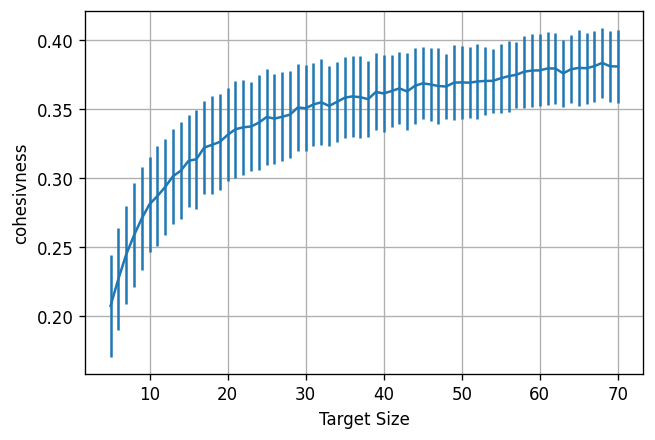

In [528]:
plt.figure(dpi=120)
plt.errorbar(np.arange(5, 71, 1),mean, yerr=std, label='')
plt.grid(True)
plt.xlabel("Target Size")
plt.ylabel("cohesivness")

#### Norm

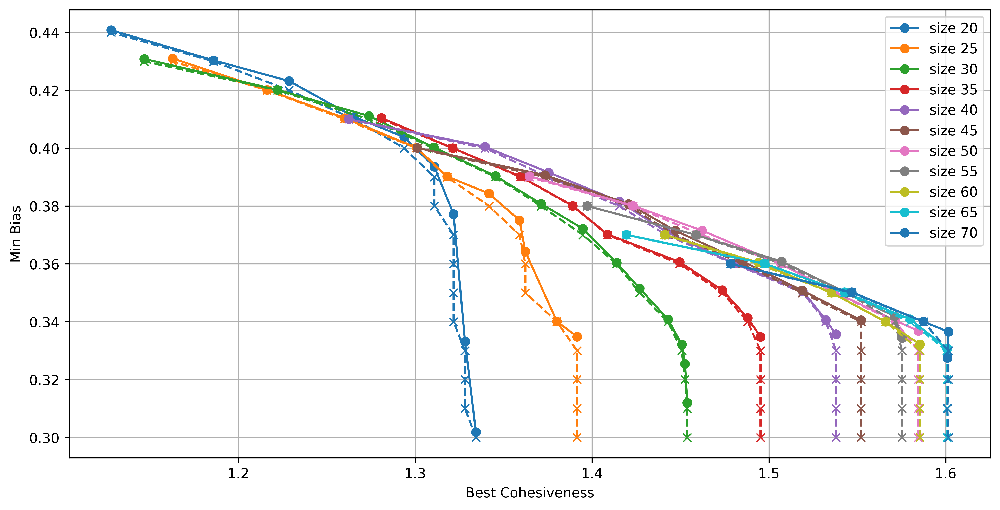

In [306]:
fig, ax = plt.subplots(dpi=480, figsize=(12,6))
for size in set(params["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR1)
    norm_const = Null_SA_cohe[size]
    COHES = np.array(COHES)/norm_const
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)
    
for size in set(params3["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params3, size, DIR3)
    norm_const = Null_SA_cohe[size]
    COHES = np.array(COHES)/norm_const
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)
    
    
ax.legend()
ax.set_xlabel("Best Cohesiveness")
ax.set_ylabel("Min Bias")
plt.grid(True)

In [300]:
Cohessss = []
for size in set(params["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR1)
    norm_const = Null_SA_cohe[size]
    COHES = np.array(COHES)/norm_const
    Cohessss.append(COHES[0])
    
for size in set(params3["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params3, size, DIR3)
    norm_const = Null_SA_cohe[size]
    COHES = np.array(COHES)/norm_const

81.0

In [301]:
100 * 0.8

80.0

In [302]:
110 * 0.5

55.0

In [328]:
params_cp.head(2)

,Size,minBias,fname
0,,,
1,20,0.30,SA.1.topN_100-keepN_20-minbias_0.3.txt
2,20,0.31,SA.2.topN_100-keepN_20-minbias_0.31.txt


### TOPSIS 

In [507]:
All_Sizes = []
All_Cohes = []
All_CutBias = []
All_RealBias = []

for size in set(params2["Size"].values):
    COHES, CutBias, RealBias, STRS = GetData(params2, size, DIR2)
    All_Sizes.extend([size]*len(COHES))
    All_Cohes.extend(COHES)
    All_CutBias.extend(CutBias)
    All_RealBias.extend(RealBias)
            
for size in set(params["Size"].values):
    COHES, CutBias, RealBias, STRS = GetData(params, size, DIR1)
    All_Sizes.extend([size]*len(COHES))
    All_Cohes.extend(COHES)
    All_CutBias.extend(CutBias)
    All_RealBias.extend(RealBias)
    
for size in set(params3["Size"].values):
    COHES, CutBias, RealBias, STRS = GetData(params3, size, DIR3)
    All_Sizes.extend([size]*len(COHES))
    All_Cohes.extend(COHES)
    All_CutBias.extend(CutBias)
    All_RealBias.extend(RealBias)
DF = pd.DataFrame(data={"Size":All_Sizes, "Cohe":All_Cohes, "CutBias":All_CutBias,
                       "Bias":All_RealBias})

DF = DF[DF["Size"]>=20]

In [508]:
min_cohe = np.min(DF["Cohe"].values)
max_cohe = np.max(DF["Cohe"].values)
min_bias = np.min(DF["Bias"].values)
max_bias = np.max(DF["Bias"].values)
print(min_cohe, max_cohe)
print(min_bias, max_bias)

0.3710292904998318 0.6097489162408435
0.30180463577630035 0.44092625853246925


In [509]:
def normtoUnit(x, xmin, xmax):
    return (x-xmin)/(xmax-xmin)
DF['NormCohe'] = DF['Cohe'].apply(lambda x: normtoUnit(x, min_cohe, max_cohe))
DF['NormBias'] = DF['Bias'].apply(lambda x: normtoUnit(x, min_bias, max_bias))

In [510]:
DF.head(5)

,Size,Cohe,CutBias,Bias,NormCohe,NormBias
261,20,0.441896,0.30,0.301805,0.296860,0.000000
262,20,0.439846,0.31,0.333210,0.288273,0.225739
263,20,0.439846,0.32,0.333210,0.288273,0.225739
264,20,0.439846,0.33,0.333210,0.288273,0.225739
265,20,0.437705,0.34,0.377178,0.279305,0.541782


In [511]:
bestpoint = np.array((1, 1))
worstpoint = np.array((0, 0))
max_opt = 0
max_idx = 0
max_size = 0
max_STRs = None
max_cut = 0
for i, row in DF.iterrows():
    cohe, bias = row["NormCohe"], row["NormBias"]
    point = np.array((cohe, bias))
    dist1 = np.sqrt(np.sum(np.square(bestpoint-point)))
    dist2 = np.sqrt(np.sum(np.square(point-worstpoint)))
    opt = dist2/(dist1+dist2)
    #print(point, opt)
    #opt = dist2
    if opt >= max_opt:
        max_opt = opt
        max_size = row["Size"]
        max_cohe = cohe
        max_bias = bias
        max_cut = row["CutBias"]
        max_idx = i
print(max_idx, max_size, max_opt, (max_cohe, max_bias))
print(DF.loc[max_idx,:])
#max_STRs = 
#RegionDistributionsList(max_STRs)

619 47.0 0.608280661653732 (0.6546900370867315, 0.5637511513161463)
Size        47.000000
Cohe         0.527317
CutBias      0.380000
Bias         0.380235
NormCohe     0.654690
NormBias     0.563751
Name: 619, dtype: float64


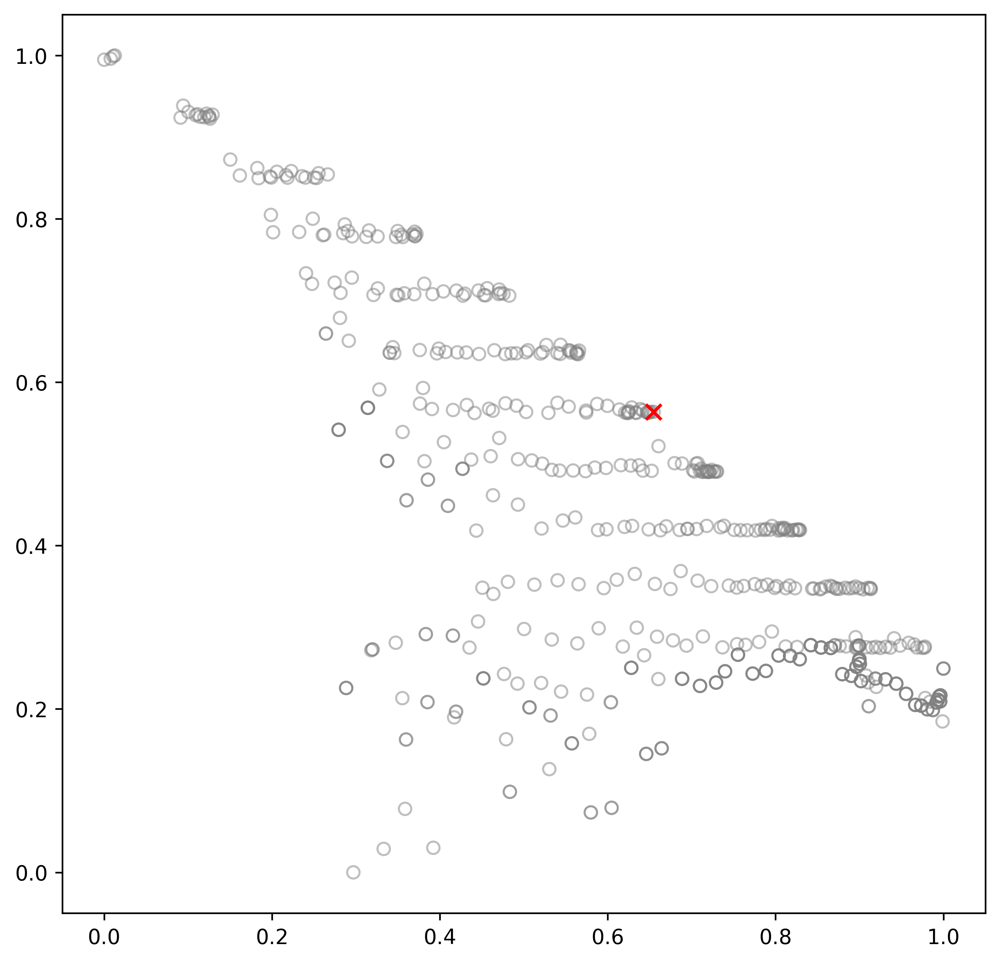

In [512]:
fig, ax = plt.subplots(dpi=480, figsize=(8,8))
ax.scatter(DF["NormCohe"], DF["NormBias"], facecolors='none', edgecolors='grey', alpha=0.5)
ax.scatter(max_cohe, max_bias, color="r", marker="x", s=55)

In [513]:
print(sizes)

[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70]


Text(0, 0.5, 'Norm Bias')

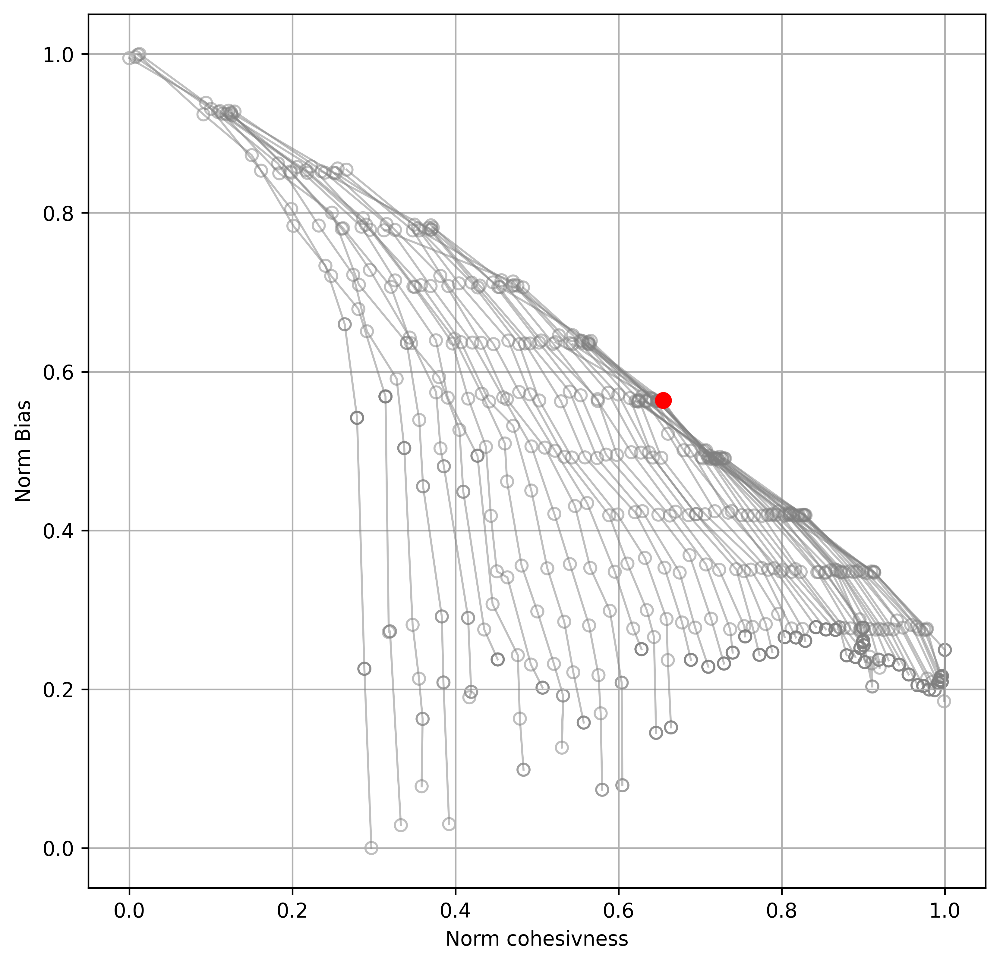

In [514]:
fig, ax = plt.subplots(dpi=480, figsize=(8,8))
sizes = list(set(DF["Size"].values))
for s in sizes:
    tmp_df = DF[DF["Size"]==s]
    ax.scatter(tmp_df["NormCohe"], tmp_df["NormBias"], facecolors='none', 
               edgecolors='grey', 
               alpha=0.5)
    ax.plot(tmp_df["NormCohe"], tmp_df["NormBias"], color="grey", alpha=0.5, lw=1)
ax.scatter(max_cohe, max_bias, color="r", marker="o", s=55, zorder=100)
ax.grid(True)
ax.set_xlabel("Norm cohesivness")
ax.set_ylabel("Norm Bias")

In [515]:
f = params[(params["Size"]==max_size)&(params["minBias"]==max_cut)]["fname"].values[0]
cohe, real_minbias, STRs = LoadSA(f, DIR1)
print(cohe, real_minbias)
RegionDistributionsList(STRs)

0.5273166511295454 0.38023461077806114
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 8 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Anteromedial_nucleus_ventral_part; Lateral_dorsal_nucleus_of_thalamus
Hippocampus 	 10 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part; Presubiculum; Entorhinal_area_lateral_part; Postsubiculum
Isocortex 	 20 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_pa

In [516]:
List2Fil(STRs, "Circuit.0430.txt")

In [432]:
g2 = subgraph(g, STRs)
dat = []
for v in g2.vs:
    dat.append([v.index, v["label"], str2reg[v["label"]]])
nodeDF = pd.DataFrame(dat, columns=["index", "STR", "REG"])
nodeDF = nodeDF.set_index("index")

In [435]:
xx = g2.community_optimal_modularity(weights='w2')

In [436]:
for cluster in xx:
    print(tabulate(nodeDF.loc[cluster, :]))

--  -----------------------------------------  ---------
 0  Anterior_cingulate_area_dorsal_part        Isocortex
 1  Anterior_cingulate_area_ventral_part       Isocortex
 4  Anteromedial_nucleus_dorsal_part           Thalamus
 5  Anteromedial_nucleus_ventral_part          Thalamus
12  Caudoputamen                               Striatum
23  Orbital_area_ventrolateral_part            Isocortex
27  Posterior_parietal_association_areas       Isocortex
29  Retrosplenial_area_lateral_agranular_part  Isocortex
31  Primary_somatosensory_area_lower_limb      Isocortex
35  Anteromedial_visual_area                   Isocortex
36  Primary_visual_area                        Isocortex
--  -----------------------------------------  ---------
--  -----------------------------------  -----------------
 2  Nucleus_accumbens                    Striatum
 3  Agranular_insular_area_ventral_part  Isocortex
 6  Anterior_olfactory_nucleus           Olfactory_areas
 7  Basolateral_amygdalar_nucleus        Amyg

In [437]:
xx2 = g2.community_optimal_modularity(weights='weight')

In [438]:
for cluster in xx2:
    print(tabulate(nodeDF.loc[cluster, :]))

--  -----------------------------------------  ---------
 0  Anterior_cingulate_area_dorsal_part        Isocortex
 1  Anterior_cingulate_area_ventral_part       Isocortex
 4  Anteromedial_nucleus_dorsal_part           Thalamus
12  Caudoputamen                               Striatum
20  Secondary_motor_area                       Isocortex
27  Posterior_parietal_association_areas       Isocortex
29  Retrosplenial_area_lateral_agranular_part  Isocortex
31  Primary_somatosensory_area_lower_limb      Isocortex
35  Anteromedial_visual_area                   Isocortex
36  Primary_visual_area                        Isocortex
--  -----------------------------------------  ---------
--  -----------------------------------  -----------------
 2  Nucleus_accumbens                    Striatum
 3  Agranular_insular_area_ventral_part  Isocortex
 6  Anterior_olfactory_nucleus           Olfactory_areas
 7  Basolateral_amygdalar_nucleus        Amygdalar
11  Claustrum                            Cortical_

# Test Old Bias

In [467]:
min_bias = 0.3
start_size = 100
target_size = np.arange(20, 71, 1)

fout = csv.writer(open("Array_size_biaslim.20-70.txt", 'w'), delimiter=",")
arr = 0
for i, t in enumerate(target_size):
    max_mean_bias = BiasDF.head(t)["EFFECT"].mean()
    bias_constranit = np.arange(min_bias, max_mean_bias, 0.01)
    for j, b in enumerate(bias_constranit):
        arr += 1
        #print(t, b)
        fout.writerow([arr, t, round(b, 2)])

In [474]:
params_old = pd.read_csv("Array_size_biaslim.20-70.txt", index_col=0, header=None)
params_old.columns = ["Size", "minBias"]
DIR_old = "/Users/jiayao/Work/ASD_Circuits/src/dat/SA/param_search_oldbias/"
for i, row in params_old.iterrows():
    for file in os.listdir(DIR1):
        if file.startswith("SA.{}.".format(i)):
            #print(file)
            params_old.loc[i, "fname"] = file
params_old.head(2)

,Size,minBias,fname
0,,,
1,20,0.30,SA.1.topN_100-keepN_20-minbias_0.3.txt
2,20,0.31,SA.2.topN_100-keepN_20-minbias_0.31.txt


Missing Data: row
Missing Data: row


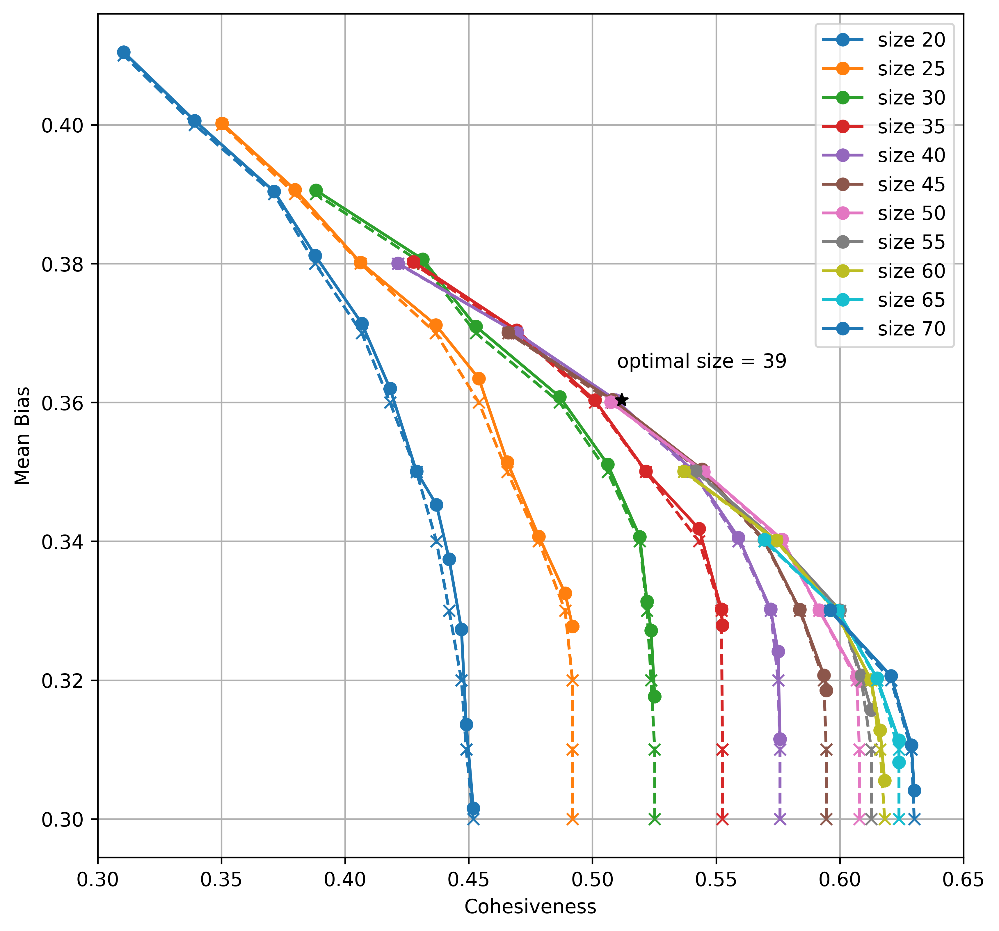

In [499]:
fig, ax = plt.subplots(dpi=480, figsize=(8,8))

for size in set(params_old["Size"].values):
    if not( size % 5==0):
        continue
    COHES, CutBias, RealBias, STRS = GetData(params_old, size, DIR_old)
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)   

    #0.5118527468339293 0.3603323979973783
ax.scatter(0.5118527468339293, 0.3603323979973783, s=40, color="black", 
          zorder=100, marker="*")
ax.annotate(xy=(0.51,0.365), text="optimal size = 39")
    
ax.legend()
ax.set_xlabel("Cohesiveness")
ax.set_ylabel("Mean Bias")
ax.set_xlim((0.3, 0.65))
#ax.set_xlim((0.35, 0.65))
plt.grid(True)
plt.savefig("figs/Pareto_minbias_cohe.old.pdf")

In [487]:
All_Sizes = []
All_Cohes = []
All_CutBias = []
All_RealBias = []

for size in set(params_old["Size"].values):
    COHES, CutBias, RealBias, STRS = GetData(params_old, size, DIR_old)
    All_Sizes.extend([size]*len(COHES))
    All_Cohes.extend(COHES)
    All_CutBias.extend(CutBias)
    All_RealBias.extend(RealBias)
DF2 = pd.DataFrame(data={"Size":All_Sizes, "Cohe":All_Cohes, "CutBias":All_CutBias,
                       "Bias":All_RealBias})

Missing Data: row
Missing Data: row
Missing Data: row
Missing Data: row
Missing Data: row
Missing Data: row
Missing Data: row
Missing Data: row


In [534]:
min_cohe = np.min(DF2["Cohe"].values)
max_cohe = np.max(DF2["Cohe"].values)
min_bias = np.min(DF2["Bias"].values)
max_bias = np.max(DF2["Bias"].values)
#min_cohe = 0.158
#max_cohe = 0.61
#min_bias = 0.3
#max_bias = 0.6
print(min_cohe, max_cohe)
print(min_bias, max_bias)
DF2['NormCohe'] = DF2['Cohe'].apply(lambda x: normtoUnit(x, min_cohe, max_cohe))
DF2['NormBias'] = DF2['Bias'].apply(lambda x: normtoUnit(x, min_bias, max_bias))


0.30182029811450156 0.6300862685264055
0.3015318317953201 0.4110233108398875


In [535]:
bestpoint = np.array((1, 1))
worstpoint = np.array((0, 0))
max_opt = 0
max_idx = 0
max_size = 0
max_STRs = None
max_cut = 0
for i, row in DF2.iterrows():
    cohe, bias = row["NormCohe"], row["NormBias"]
    point = np.array((cohe, bias))
    dist1 = np.sqrt(np.sum(np.square(bestpoint-point)))
    dist2 = np.sqrt(np.sum(np.square(point-worstpoint)))
    opt = dist2/(dist1+dist2)
    #print(point, opt)
    #opt = dist2
    if opt >= max_opt:
        max_opt = opt
        max_size = row["Size"]
        max_cohe = cohe
        max_bias = bias
        max_cut = row["CutBias"]
        max_idx = i
print(max_idx, max_size, max_opt, (max_cohe, max_bias))
print(DF2.loc[max_idx,:])
#max_STRs = 

203 39.0 0.5874748704332442 (0.6398240075140343, 0.5370332624525422)
Size        39.000000
Cohe         0.511853
CutBias      0.360000
Bias         0.360332
NormCohe     0.639824
NormBias     0.537033
Name: 203, dtype: float64


Text(0, 0.5, 'Norm Bias')

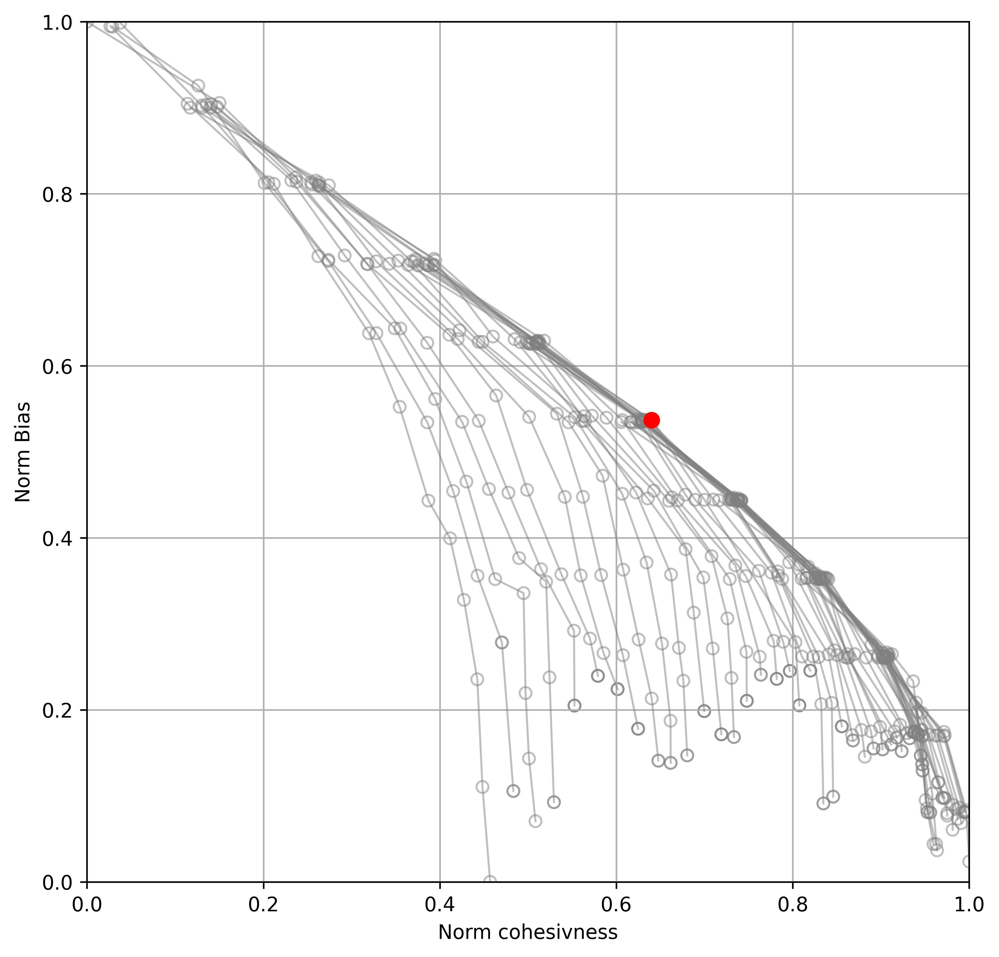

In [536]:
fig, ax = plt.subplots(dpi=480, figsize=(8,8))
sizes = list(set(DF2["Size"].values))
for s in sizes:
    tmp_df = DF2[DF2["Size"]==s]
    ax.scatter(tmp_df["NormCohe"], tmp_df["NormBias"], facecolors='none', 
               edgecolors='grey', 
               alpha=0.5)
    ax.plot(tmp_df["NormCohe"], tmp_df["NormBias"], color="grey", alpha=0.5, lw=1)
ax.scatter(max_cohe, max_bias, color="r", marker="o", s=55, zorder=100)
ax.grid(True)
ax.set_xlim((0,1))
ax.set_ylim((0,1))
ax.set_xlabel("Norm cohesivness")
ax.set_ylabel("Norm Bias")

In [537]:
f = params_old[(params_old["Size"]==max_size)&
               (params_old["minBias"]==max_cut)]["fname"].values[0]
cohe, real_minbias, STRs = LoadSA(f, DIR_old)
print(cohe, real_minbias)
RegionDistributionsList(STRs)

0.5118527468339293 0.3603323979973783
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 5 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Paraventricular_nucleus_of_the_thalamus
Hippocampus 	 7 	 Dentate_gyrus; Field_CA3; Subiculum_ventral_part; Field_CA1; Field_CA2; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Pallidum 	 1 	 Bed_nuclei_of_the_stria_terminalis
Isocortex 	 11 	 Orbital_area_lateral_part; Prelimbic_area; Orbital_area_ventrolateral_part; Infralimbic_area; Agranular_insular_area_posterior_part; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Agranular_insular_area_ventral_part; Orbital_area_medial_part; Frontal_pole_cerebral_cortex; Perirhinal_area
Cortical_subplate 	 3 	 Endopiriform_nucleus_dorsal_part; Claustrum; Endopiriform_nucleus_ventral_part
Amygdalar 	 5 	 Lateral_amygdalar_nucleus; Basomedial_amygdalar_nucleus; Intercalated_amygdalar_nucleus; Basolateral_amygdalar_nucleus; P

# Complete Search

In [525]:
min_bias = 0
start_size = 213
target_size = np.arange(5, 200, 5)

fout = csv.writer(open("Array_size_biaslim.complete.txt", 'w'), delimiter=",")
arr = 0
for i, t in enumerate(target_size):
    max_mean_bias = BiasDF.head(t)["EFFECT"].mean()
    #print(min_bias, max_mean_bias)
    bias_constranit = np.arange(min_bias, max_mean_bias, 0.01)
    for j, b in enumerate(bias_constranit):
        arr += 1
        #print(t, b)
        fout.writerow([arr, t, round(b, 2)])

In [688]:
params_comp = pd.read_csv("Array_size_biaslim.complete.txt", index_col=0, header=None)
params_comp.columns = ["Size", "minBias"]
DIR_comp = "/Users/jiayao/Work/ASD_Circuits/src/dat/SA/param_search_complete/"
for i, row in params_comp.iterrows():
    for file in os.listdir(DIR_comp):
        if file.startswith("SA.{}.".format(i)):
            #print(file)
            params_comp.loc[i, "fname"] = file
params_comp.head(2)

,Size,minBias,fname
0,,,
1,5,0.00,SA.1.topN_213-keepN_5-minbias_0.0.txt
2,5,0.01,SA.2.topN_213-keepN_5-minbias_0.01.txt


Missing Data: Size        175
minBias    0.08
fname       NaN
Name: 1160, dtype: object
[175, 175, 170, 165, 165, 160, 155, 150, 150, 145, 140, 135, 130, 125, 125, 115, 105, 105, 100, 95, 90, 80, 75, 80, 75, 65, 60, 50, 55, 50, 45, 40, 35, 35, 30, 25, 20, 15, 20, 15, 10, 10, 5, 5, 5, 5]


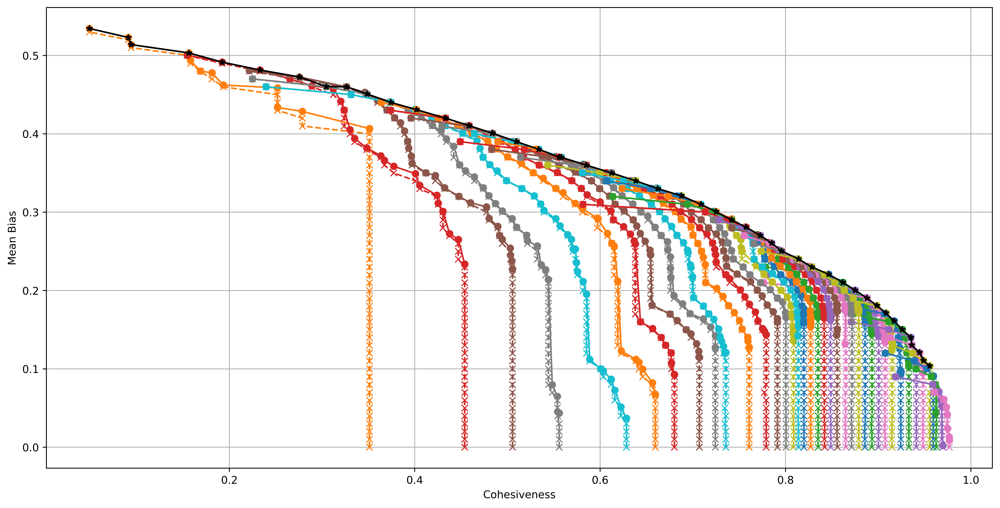

In [803]:
fig, ax = plt.subplots(dpi=720, figsize=(16,8))

for size in set(params_comp["Size"].values):
    #if not( size % 10==0):
    #    continue
    COHES, CutBias, RealBias, STRS = GetData(params_comp, size, DIR_comp)
    line, = ax.plot(COHES, RealBias, 'o-', label="size {}".format(size))
    color = line.get_color()
    ax.plot(COHES, CutBias, 'x--', color=color)   

ax.plot(Front_cohes, Front_biases, marker="*", color="black", zorder=100)
#print(Front_sizes)
    
#ax.legend()
ax.set_xlabel("Cohesiveness")
ax.set_ylabel("Mean Bias")
#ax.set_xlim((0.3, 0.65))
#ax.set_xlim((0.35, 0.65))
plt.grid(True)
plt.savefig("figs/Pareto_minbias_cohe.comp.pdf")

##### Pareto Front Search

In [717]:
DF2.head(2)

,Size,Cohe,CutBias,Bias,NormCohe,NormBias
0,130,0.885692,0.00,0.166135,0.922881,0.152172
1,130,0.885692,0.01,0.166135,0.922881,0.152172


In [764]:
min_bias = np.min(DF2["Bias"].values)
max_bias = np.max(DF2["Bias"].values)
Biases = np.arange(min_bias, max_bias, 0.005)

In [781]:
Front_biases = []
Front_cut_biases = []
Front_cohes = []
Front_sizes = []
Front_indice = []
for bias in Biases:
    tmp_df = DF2[DF2["Bias"]>bias]
    xx = tmp_df[tmp_df.Cohe == tmp_df.Cohe.max()]
    #print(xx.index[0])
    if xx.index[0] not in Front_indice:
    #print(xx)
        Front_indice.append(xx.index[0])
        Front_biases.append(xx["Bias"].values[0])
        Front_cohes.append(xx["Cohe"].values[0])
        Front_sizes.append(xx["Size"].values[0])
        Front_cut_biases.append(xx["CutBias"].values[0])

[175, 175, 170, 165, 165, 160, 155, 150, 150, 145, 140, 135, 130, 125, 125, 115, 105, 105, 100, 95, 90, 80, 75, 80, 75, 65, 60, 50, 55, 50, 45, 40, 35, 35, 30, 25, 20, 15, 20, 15, 10, 10, 5, 5, 5, 5]


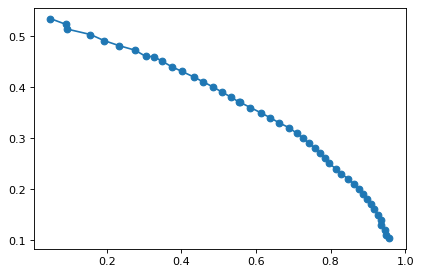

In [782]:
plt.plot(Front_cohes, Front_biases, marker="o")
print(Front_sizes)

In [783]:
def searchFil(text, DIR):
    RES = []
    for file in os.listdir(DIR):
        if text in file:
            RES.append(file)
    return RES
DIR_comp = "dat/SA/param_search_complete/"
print(searchFil("keepN_30-minbias_0.4.", DIR_comp))

['SA.290.topN_213-keepN_30-minbias_0.4.txt']


In [796]:
dat = []
for i, (cutb, size) in enumerate(zip(Front_cut_biases, Front_sizes)):
    search_text = "keepN_{}-minbias_{}.".format(size, cutb)
    f = searchFil(search_text, DIR_comp)[0]
    cohe, real_minbias, STRs = LoadSA(f, DIR_comp)
    #if size < 200:
    #    print("size:%d\tcohe:%.4f\tbias:%.4f"%(size, cohe, real_minbias))
    #    RegionDistributionsList(STRs)
    #    print("\n")
    dat.append([size, cohe, real_minbias, RegionDistributionsList(STRs)])

In [799]:
outDF = pd.DataFrame(data=dat, columns=["Size", "Cohe", "Bias", "STRs"])

In [801]:
outDF.to_csv("../test.csv")

##### some circuits

In [684]:
size = 30
COHES, CutBias, RealBias, STRS = GetData(params_comp, size, DIR_comp)
idx=40
print("cohe:%.3f\tbias lim:%.3f\tbias:%.3f" %(
    COHES[idx], CutBias[idx], RealBias[idx]))
RegionDistributionsList(STRS[idx])

cohe:0.458	bias lim:0.400	bias:0.400
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 6 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part
Hippocampus 	 1 	 Entorhinal_area_lateral_part
Isocortex 	 18 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; posteromedial_visual_area; Posterolateral_visual_area; Anterolateral_visual_area; Frontal_pole_cerebral_cortex
Cortical_subplate 	 1 	 Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 1 	 Dorsal_peduncular_area


In [687]:
size = 30
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR1)
#COHES, CutBias, RealBias, STRS = GetData(params2, size, DIR2)
idx=12
print("cohe:%.3f\tbias lim:%.3f\tbias:%.3f" %(
    COHES[idx], CutBias[idx], RealBias[idx]))
RegionDistributionsList(STRS[idx])

cohe:0.428	bias lim:0.420	bias:0.420
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 5 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part
Hippocampus 	 7 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Isocortex 	 10 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Agranular_insular_area_ventral_part
Cortical_subplate 	 2 	 Endopiriform_nucleus_dorsal_part; Claustrum
Amygdalar 	 1 	 Basolateral_amygdalar_nucleus
Olfactory_areas 	 3 	 Dorsal_peduncular_area; Anterior_olfactory_nucleus; Taenia_tecta


In [685]:
size = 30
COHES, CutBias, RealBias, STRS = GetData(params_comp, size, DIR_comp)
idx=36
print("cohe:%.3f\tbias lim:%.3f\tbias:%.3f" %(
    COHES[idx], CutBias[idx], RealBias[idx]))
RegionDistributionsList(STRS[idx])

cohe:0.515	bias lim:0.360	bias:0.362
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 4 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Anteromedial_nucleus_dorsal_part
Hippocampus 	 1 	 Entorhinal_area_lateral_part
Isocortex 	 11 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anterior_cingulate_area_dorsal_part; Secondary_motor_area; Orbital_area_medial_part; Agranular_insular_area_ventral_part; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part; Perirhinal_area
Cortical_subplate 	 3 	 Endopiriform_nucleus_dorsal_part; Claustrum; Endopiriform_nucleus_ventral_part
Amygdalar 	 4 	 Basolateral_amygdalar_nucleus; Piriform_amygdalar_area; Cortical_amygdalar_area_posterior_part; Cortical_amygdalar_area_anterior_part
Olfactory_areas 	 5 	 Dorsal_peduncular_area; Anterior_olfactory_nucleus; Taenia_tecta; Piriform_area; Accessory_olfactory_bulb


In [680]:
size = 40
COHES, CutBias, RealBias, STRS = GetData(params_comp, size, DIR_comp)
idx=37
print("cohe:%.3f\tbias lim:%.3f\tbias:%.3f" %(
    COHES[idx], CutBias[idx], RealBias[idx]))
RegionDistributionsList(STRS[idx])

cohe:0.527	bias lim:0.370	bias:0.370
Striatum 	 2 	 Nucleus_accumbens; Caudoputamen
Thalamus 	 6 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part
Hippocampus 	 1 	 Entorhinal_area_lateral_part
Isocortex 	 20 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; posteromedial_visual_area; Posterolateral_visual_area; Anterolateral_visual_area; Frontal_pole_cerebral_cortex; Agranular_insular_area_dorsal_part; Perirhinal_area
Cortical_subplate 	 3 	 Endopiriform_nucleus_dorsal_part; Claustrum; Endopiriform_nu

In [652]:
xx = BiasDF.loc[STRS[idx],:]["EFFECT"].values

In [678]:
size = 40
COHES, CutBias, RealBias, STRS = GetData(params, size, DIR1)
#COHES, CutBias, RealBias, STRS = GetData(params2, size, DIR2)
idx=11
print("cohe:%.3f\tbias lim:%.3f\tbias:%.3f" %(
    COHES[idx], CutBias[idx], RealBias[idx]))
RegionDistributionsList(STRS[idx])

cohe:0.456	bias lim:0.410	bias:0.410
Striatum 	 4 	 Nucleus_accumbens; Caudoputamen; Lateral_septal_nucleus_rostral_rostroventral_part; Lateral_septal_nucleus_caudal_caudodorsal_part
Thalamus 	 6 	 Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part
Hippocampus 	 8 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Isocortex 	 16 	 Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Posterior_parietal_association_areas; Agranular_insular_area_ventral_part; 

In [654]:
yy = BiasDF.loc[STRS[idx],:]["EFFECT"].values

(array([3., 2., 2., 7., 8., 4., 5., 5., 3., 1.]),
 array([0.14984229, 0.1944965 , 0.23915071, 0.28380492, 0.32845913,
        0.37311334, 0.41776755, 0.46242177, 0.50707598, 0.55173019,
        0.5963844 ]),
 <BarContainer object of 10 artists>)

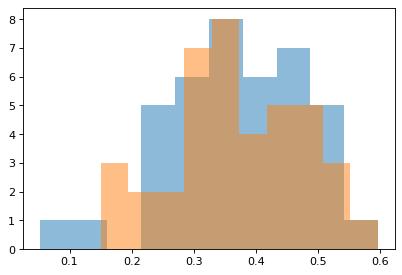

In [655]:
plt.hist(xx, alpha=0.5)
plt.hist(yy, alpha=0.5)

##### opt

In [1024]:
BiasDF[BiasDF["EFFECT"]>0]

,EFFECT,REGION,Rank
STR,,,
Prelimbic_area,0.596384,Isocortex,1
Orbital_area_lateral_part,0.537085,Isocortex,2
Nucleus_accumbens,0.528317,Striatum,3
Infralimbic_area,0.518567,Isocortex,4
Primary_somatosensory_area_lower_limb,0.495025,Isocortex,5
...,...,...,...
Dorsal_part_of_the_lateral_geniculate_complex,0.014682,Thalamus,117
Posterior_limiting_nucleus_of_the_thalamus,0.012790,Thalamus,118
Periventricular_hypothalamic_nucleus_posterior_part,0.010625,Hypothalamus,119


In [1030]:
All_Sizes = []
All_Cohes = []
All_CutBias = []
All_RealBias = []
All_Index = []

for size in set(params_comp["Size"].values):
    if size > 121:
        continue
    COHES, CutBias, RealBias, STRS = GetData(params_comp, size, DIR_comp)
    All_Sizes.extend([size]*len(COHES))
    All_Cohes.extend(COHES)
    All_CutBias.extend(CutBias)
    All_RealBias.extend(RealBias)
DF2 = pd.DataFrame(data={"Size":All_Sizes, "Cohe":All_Cohes, "CutBias":All_CutBias,
                       "Bias":All_RealBias})
DF2 = DF2[(DF2["Bias"]>0.2) ]
#DF2 = DF2[(DF2["Bias"]>0.20) & (DF2["Cohe"]<0.7)]
#DF2 = DF2[(DF2["Size"]<70) ]

In [1031]:
min_cohe = np.min(DF2["Cohe"].values)
max_cohe = np.max(DF2["Cohe"].values)
min_bias = np.min(DF2["Bias"].values)
max_bias = np.max(DF2["Bias"].values)
print(min_cohe, max_cohe)
print(min_bias, max_bias)
DF2['NormCohe'] = DF2['Cohe'].apply(lambda x: normtoUnit(x, min_cohe, max_cohe))
DF2['NormBias'] = DF2['Bias'].apply(lambda x: normtoUnit(x, min_bias, max_bias))

0.049006629823045225 0.8599449104741904
0.20005998722683122 0.5344797342587742


In [1032]:
bestpoint = np.array((1, 1))
worstpoint = np.array((0, 0))
max_opt = 0
max_idx = 0
max_size = 0
max_STRs = None
max_cut = 0

opt_cut = 0.640
other_id = []
for i, row in DF2.iterrows():
    cohe, bias = row["NormCohe"], row["NormBias"]
    point = np.array((cohe, bias))
    dist1 = np.sqrt(np.sum(np.square(bestpoint-point)))
    dist2 = np.sqrt(np.sum(np.square(point-worstpoint)))
    opt = dist2/(dist1+dist2)
    #print(point, opt)
    #opt = dist2
    if opt >= max_opt:
        max_opt = opt
        max_size = row["Size"]
        max_cohe = cohe
        max_bias = bias
        max_cut = row["CutBias"]
        max_idx = i
    if opt > opt_cut:
        other_id.append(i)
print(max_idx, max_size, max_opt, (max_cohe, max_bias))
print(DF2.loc[max_idx,:])
#max_STRs = 

420 45.0 0.568145142474865 (0.5680872484244324, 0.5682030383871689)
Size        45.000000
Cohe         0.509690
CutBias      0.390000
Bias         0.390078
NormCohe     0.568087
NormBias     0.568203
Name: 420, dtype: float64


In [1033]:
DF2.loc[other_id,:]

,Size,Cohe,CutBias,Bias,NormCohe,NormBias


In [1034]:
f = params_comp[(params_comp["Size"]==max_size)&
               (params_comp["minBias"]==max_cut)]["fname"].values[0]
cohe, real_minbias, STRs = LoadSA(f, DIR_comp)
print(cohe, real_minbias)
print(RegionDistributionsList(STRs))

0.5096903263201944 0.3900783035870496
Striatum	3	Nucleus_accumbens; Caudoputamen; Lateral_septal_nucleus_caudal_caudodorsal_part
Thalamus	7	Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Anteromedial_nucleus_ventral_part
Hippocampus	8	Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part; Entorhinal_area_lateral_part
Isocortex	21	Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Primary_somatosensory_area_trunk; Posterior_parietal_association_areas; Agranular_insular_area_ventral_par

In [808]:
BiasDF.loc[STRS[idx],:]

,EFFECT,REGION,Rank
STR,,,
Prelimbic_area,0.596384,Isocortex,1
Orbital_area_lateral_part,0.537085,Isocortex,2
Nucleus_accumbens,0.528317,Striatum,3
Infralimbic_area,0.518567,Isocortex,4
Primary_somatosensory_area_lower_limb,0.495025,Isocortex,5
...,...,...,...
Magnocellular_nucleus,-0.024882,Pallidum,127
Nucleus_of_the_lateral_olfactory_tract,-0.025689,Olfactory_areas,129
Medial_septal_nucleus,-0.034073,Pallidum,130


In [702]:
size = 45
COHES, CutBias, RealBias, STRS = GetData(params_comp, size, DIR_comp)
idx=25
print("cohe:%.3f\tbias lim:%.3f\tbias:%.3f" %(
    COHES[idx], CutBias[idx], RealBias[idx]))
RegionDistributionsList(STRS[idx])

cohe:0.673	bias lim:0.250	bias:0.252
Striatum 	 3 	 Nucleus_accumbens; Fundus_of_striatum; Olfactory_tubercle
Thalamus 	 3 	 Nucleus_of_reuniens; Parataenial_nucleus; Paraventricular_nucleus_of_the_thalamus
Hippocampus 	 10 	 Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part; Presubiculum; Entorhinal_area_lateral_part; Entorhinal_area_medial_part_dorsal_zone
Pallidum 	 5 	 Bed_nuclei_of_the_stria_terminalis; Substantia_innominata; Magnocellular_nucleus; Medial_septal_nucleus; Diagonal_band_nucleus
Isocortex 	 3 	 Agranular_insular_area_ventral_part; Agranular_insular_area_posterior_part; Perirhinal_area
Cortical_subplate 	 3 	 Endopiriform_nucleus_dorsal_part; Claustrum; Endopiriform_nucleus_ventral_part
Amygdalar 	 10 	 Intercalated_amygdalar_nucleus; Basomedial_amygdalar_nucleus; Lateral_amygdalar_nucleus; Basolateral_amygdalar_nucleus; Piriform_amygdalar_area; Posterior_amygdalar_nucleus; Cortical_amygdalar_area_posterior_pa

Text(0, 0.5, 'Norm Bias')

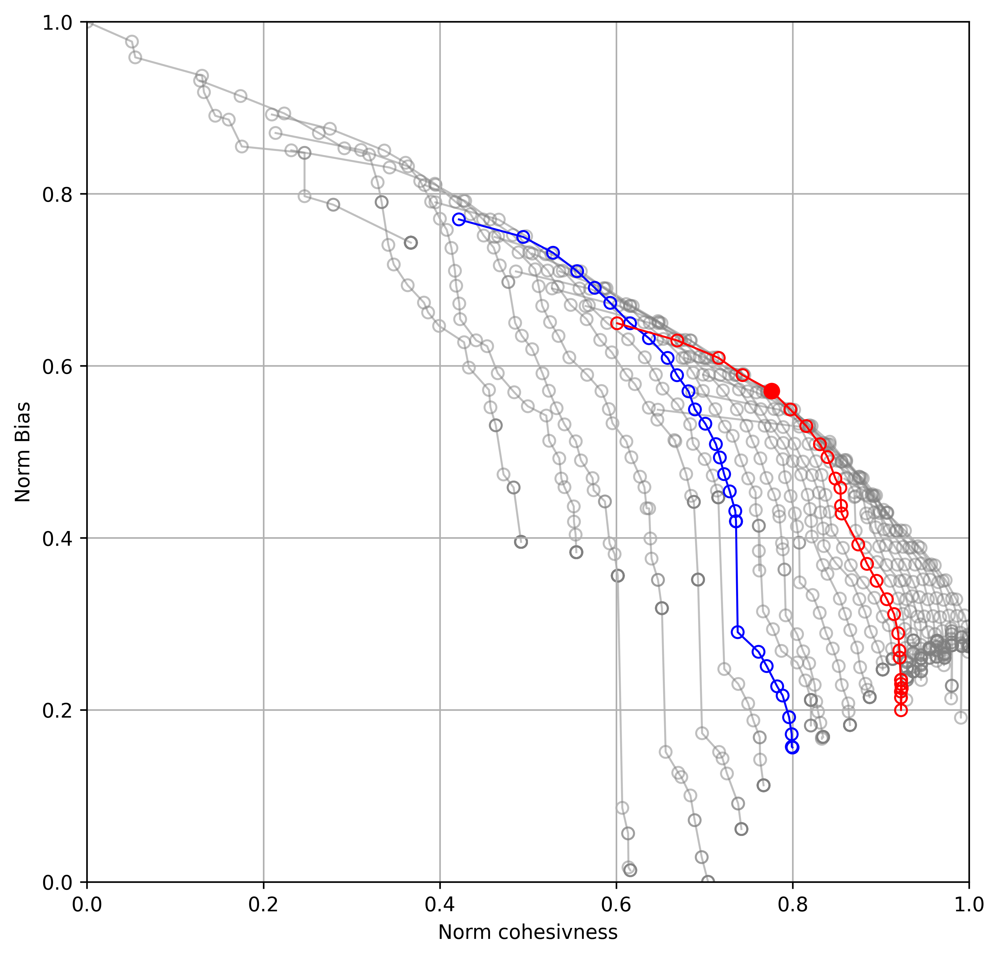

In [1029]:
fig, ax = plt.subplots(dpi=480, figsize=(8,8))
sizes = list(set(DF2["Size"].values))
for s in sizes:
    tmp_df = DF2[DF2["Size"]==s]
    if s==40:
        ax.scatter(tmp_df["NormCohe"], tmp_df["NormBias"], facecolors='none', 
                   edgecolors='blue', 
                   alpha=1, zorder=100)
        ax.plot(tmp_df["NormCohe"], tmp_df["NormBias"], color="blue", alpha=1, lw=1,
               zorder=100)
    elif s==75:
        ax.scatter(tmp_df["NormCohe"], tmp_df["NormBias"], facecolors='none', 
                   edgecolors='red', 
                   alpha=1, zorder=100)
        ax.plot(tmp_df["NormCohe"], tmp_df["NormBias"], color="red", alpha=1, lw=1,
               zorder=100)
    else:
        ax.scatter(tmp_df["NormCohe"], tmp_df["NormBias"], facecolors='none', 
                   edgecolors='grey', 
                   alpha=0.5, zorder=0)
        ax.plot(tmp_df["NormCohe"], tmp_df["NormBias"], color="grey", alpha=0.5, lw=1,
               zorder=0)
ax.scatter(max_cohe, max_bias, color="r", marker="o", s=55, zorder=100)
ax.grid(True)
ax.set_xlim((0,1))
ax.set_ylim((0,1))
ax.set_xlabel("Norm cohesivness")
ax.set_ylabel("Norm Bias")

#### NORM BIAS AND COHE

In [919]:
DF3 = DF2.copy(deep=True)

In [920]:
def GetBestCohe(k):
    Fil = "/Users/jiayao/Work/ASD_Circuits/src/dat/SA/Null_top213/SA.None.topN_213-keepN_{}.txt".format(k)
    fin = open(Fil, 'r')
    max_cohe, max_STRs = 0, []
    for l in fin.readlines():
        l = l.strip().split()
        cohe = float(l[0])
        STRs = l[1].split(",")
        if cohe > max_cohe:
            max_cohe = cohe
            max_STRs = STRs
    return max_cohe, max_STRs
    
Best_Bias_size = {}
Worst_Bias_size = {}
Avg_Cohe_size = {}
Best_Cohe_size = {}
for i in np.arange(2, 213, 1):
    Best_Bias_size[i] = BiasDF.head(i)["EFFECT"].mean()
    Worst_Bias_size[i] = BiasDF.tail(i)["EFFECT"].mean()
    Avg_Cohe_size[i] = i/213
    Best_Cohe_size[i] = GetBestCohe(i)[0]
    

In [923]:
for i in np.arange(2, 213, 1):
    if Best_Cohe_size[i] == 0:
        print(i, Best_Cohe_size[i])
Best_Cohe_size[172] = np.mean([Best_Cohe_size[171],Best_Cohe_size[173]])
Best_Cohe_size[185] = np.mean([Best_Cohe_size[184],Best_Cohe_size[186]])

172 0
185 0


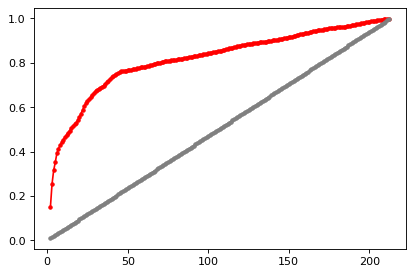

In [924]:
plt.plot(Best_Cohe_size.keys(), Best_Cohe_size.values(), marker=".", color="red")
plt.plot(Best_Cohe_size.keys(), np.array(list(Best_Cohe_size.keys()))/213, marker=".", color="grey")

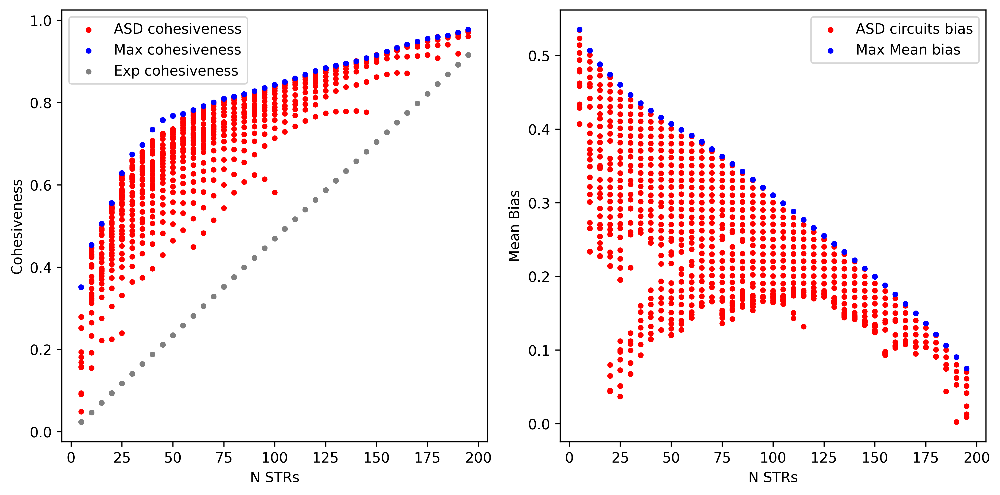

In [1012]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5), dpi=480)
sizes, dat1, dat2, dat3 = [],[],[], []
for i, row in DF3.iterrows():
    sizes.append(row["Size"])
    dat1.append(row["Cohe"])
    dat2.append(Best_Cohe_size[row["Size"]])
    dat3.append(row["Size"]/213)
ax1.scatter(sizes, dat1, marker=".", color="red", label="ASD cohesiveness")
ax1.scatter(sizes, dat2, marker=".", color="blue", label="Max cohesiveness")
ax1.scatter(sizes, dat3, marker=".", color="grey", label="Exp cohesiveness")
ax1.legend()
ax1.set_ylabel("Cohesiveness")
ax1.set_xlabel("N STRs")

sizes, dat1, dat2, dat3 = [],[],[],[]
for i, row in DF3.iterrows():
    size = int(row["Size"])
    sizes.append(row["Size"])
    dat1.append(row["Bias"])
    dat2.append(BiasDF.head(size)["EFFECT"].mean())
    dat3.append(BiasDF.tail(size)["EFFECT"].mean())
ax2.scatter(sizes, dat1, marker=".", color="red", label="ASD circuits bias")
ax2.scatter(sizes, dat2, marker=".", color="blue", label="Max Mean bias")
ax2.set_ylabel("Mean Bias")
#plt.scatter(sizes, dat3, marker=".", color="grey", label="Exp")
ax2.legend()
ax2.set_xlabel("N STRs")

plt.tight_layout()
plt.savefig("figs/Max_Cohe_Bias.pdf")

In [1]:
280/6

46.666666666666664

##### xx

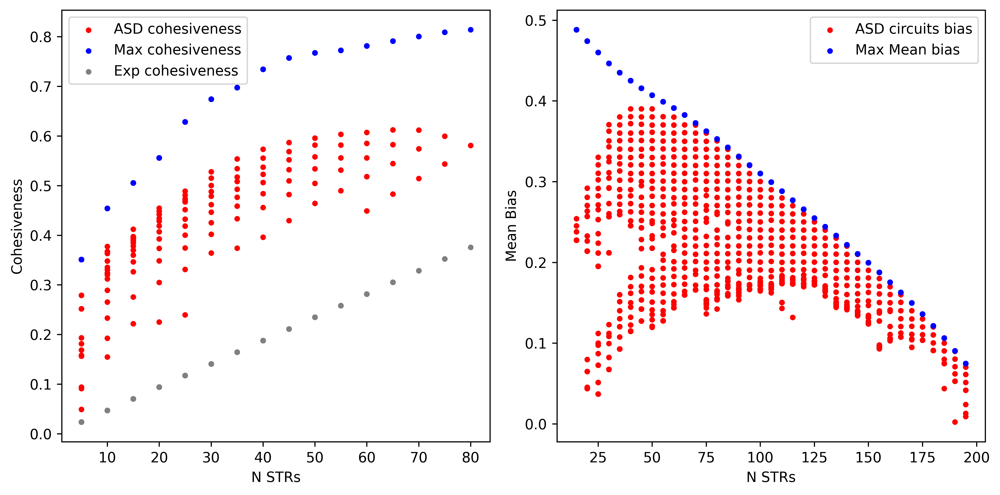

In [961]:
Target_Cohe = 0.5
Target_Bias = 0.35
#DF_TMP = DF3
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5), dpi=480)
sizes, dat1, dat2, dat3 = [],[],[], []
for i, row in DF3.iterrows():
    if row["Bias"] > Target_Bias:
        sizes.append(row["Size"])
        dat1.append(row["Cohe"])
        dat2.append(Best_Cohe_size[row["Size"]])
        dat3.append(row["Size"]/213)
ax1.scatter(sizes, dat1, marker=".", color="red", label="ASD cohesiveness")
ax1.scatter(sizes, dat2, marker=".", color="blue", label="Max cohesiveness")
ax1.scatter(sizes, dat3, marker=".", color="grey", label="Exp cohesiveness")
ax1.legend()
ax1.set_ylabel("Cohesiveness")
ax1.set_xlabel("N STRs")

sizes, dat1, dat2, dat3 = [],[],[],[]
for i, row in DF3.iterrows():
    if row["Cohe"] > Target_Cohe:
        size = int(row["Size"])
        sizes.append(row["Size"])
        dat1.append(row["Bias"])
        dat2.append(BiasDF.head(size)["EFFECT"].mean())
        dat3.append(BiasDF.tail(size)["EFFECT"].mean())
ax2.scatter(sizes, dat1, marker=".", color="red", label="ASD circuits bias")
ax2.scatter(sizes, dat2, marker=".", color="blue", label="Max Mean bias")
ax2.set_ylabel("Mean Bias")
#plt.scatter(sizes, dat3, marker=".", color="grey", label="Exp")
ax2.legend()
ax2.set_xlabel("N STRs")

plt.tight_layout()

In [986]:
DF3.to_csv("test.csv")

Text(0.5, 0, 'Cohe')

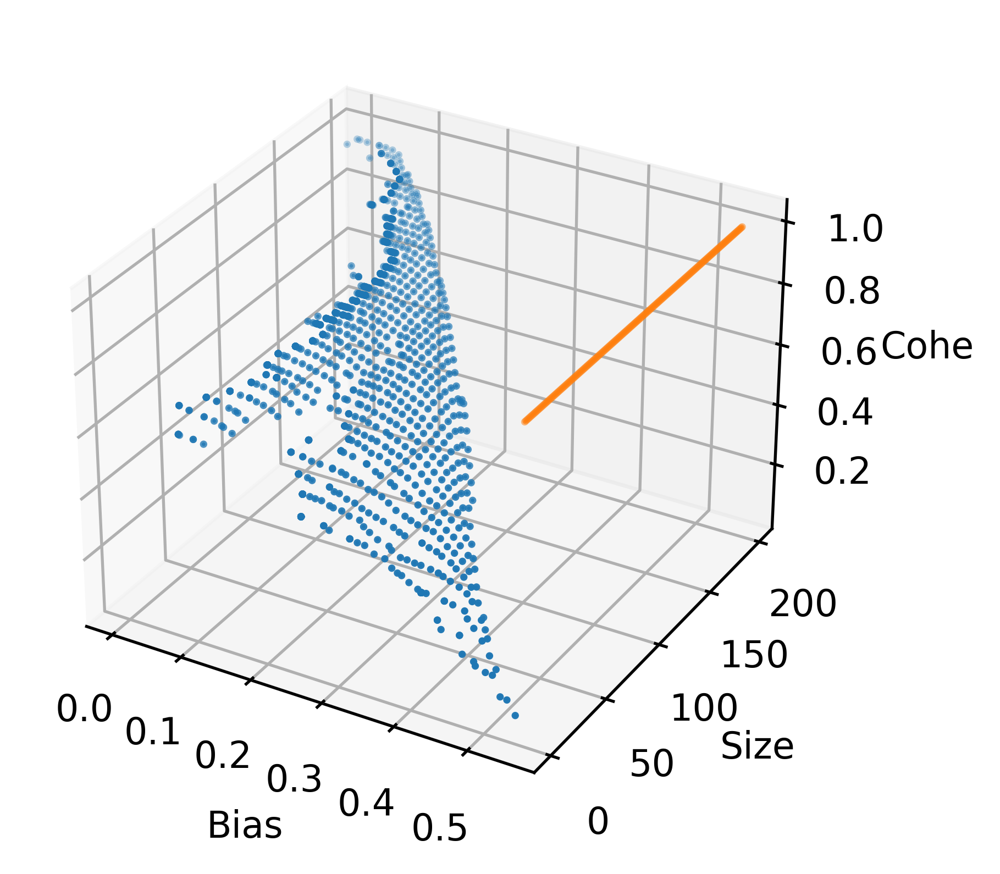

In [1010]:
%matplotlib inline
fig = plt.figure(dpi=480)
ax = fig.add_subplot(projection='3d')
sizes, cohes, bias = [],[],[]
for i, row in DF3.iterrows():
    sizes.append(row["Bias"])
    cohes.append(row["Size"])
    bias.append(row["Cohe"])
sizes = np.array(sizes)
cohes = np.array(cohes)
bias = np.array(bias)
##ax.plot_trisurf(sizes, cohes, bias)
ax.scatter(sizes, cohes, bias, s=1)

xx, yy = np.ones(200) * 0.55, np.arange(200)
z = np.ones(200)
#print(z)
#ax.plot_surface(xx, yy, z, alpha=0.5)
ax.scatter(xx, yy, z, alpha=0.5, s=1)

ax.set_xlabel('Bias')
ax.set_ylabel('Size')
ax.set_zlabel('Cohe')

In [1004]:
xx

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [1005]:
yy

array([0.55, 0.55, 0.55, 0.55, 0.55, 0.55, 0.55, 0.55, 0.55, 0.55])

In [1006]:
z

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

### XS

In [1022]:
#min_cohe = 1
for i, row in DF3.iterrows():
    size = row["Size"]
    a = row["Cohe"] - (size/213)
    b = Best_Cohe_size[size] - size/213
    DF3.loc[i, "NormCohe"] = a/b
    #DF3.loc[i, "NormCohe"] = row["Cohe"] - size/213
    DF3.loc[i, "NormBias"] = row["Bias"] / Best_Bias_size[size]

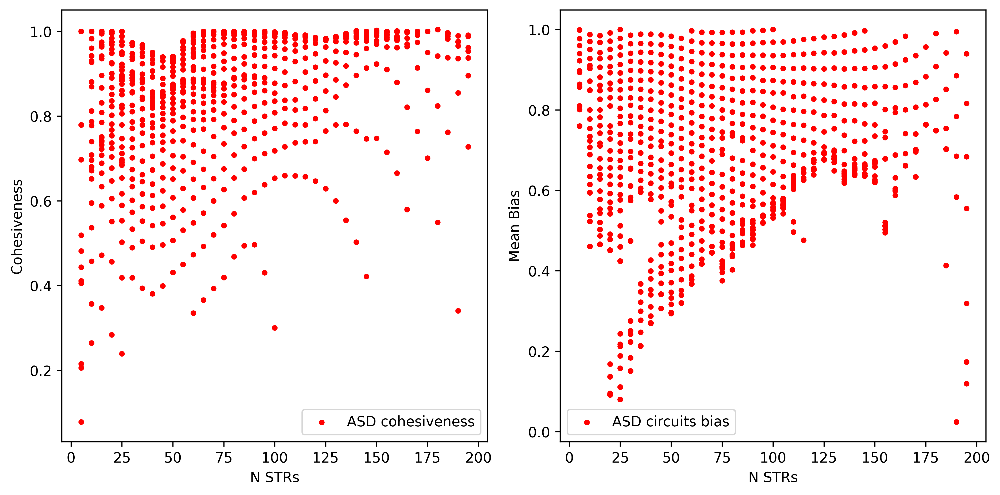

In [1023]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5), dpi=480)
sizes, dat1, dat2, dat3 = [],[],[], []
for i, row in DF3.iterrows():
    sizes.append(row["Size"])
    dat1.append(row["NormCohe"])
    #dat2.append(Best_Cohe_size[row["Size"]])
    #dat3.append(row["Size"]/213)
ax1.scatter(sizes, dat1, marker=".", color="red", label="ASD cohesiveness")

ax1.legend()
ax1.set_ylabel("Cohesiveness")
ax1.set_xlabel("N STRs")

sizes, dat1, dat2, dat3 = [],[],[],[]
for i, row in DF3.iterrows():
    size = int(row["Size"])
    sizes.append(row["Size"])
    dat1.append(row["NormBias"])

ax2.scatter(sizes, dat1, marker=".", color="red", label="ASD circuits bias")
#ax2.scatter(sizes, dat2, marker=".", color="blue", label="Max Mean bias")
ax2.set_ylabel("Mean Bias")
#plt.scatter(sizes, dat3, marker=".", color="grey", label="Exp")
ax2.legend()
ax2.set_xlabel("N STRs")

plt.tight_layout()
plt.savefig("figs/Norm_Cohe_Bias.pdf")

In [942]:
Best_Cohe_size[90]

0.8275569349005261

In [943]:
DF4 = DF3[DF3["Size"]<=300]

In [944]:
DF4[DF4["NormCohe"]>1.2]

,Size,Cohe,CutBias,Bias,NormCohe,NormBias


Text(0, 0.5, 'Norm Bias')

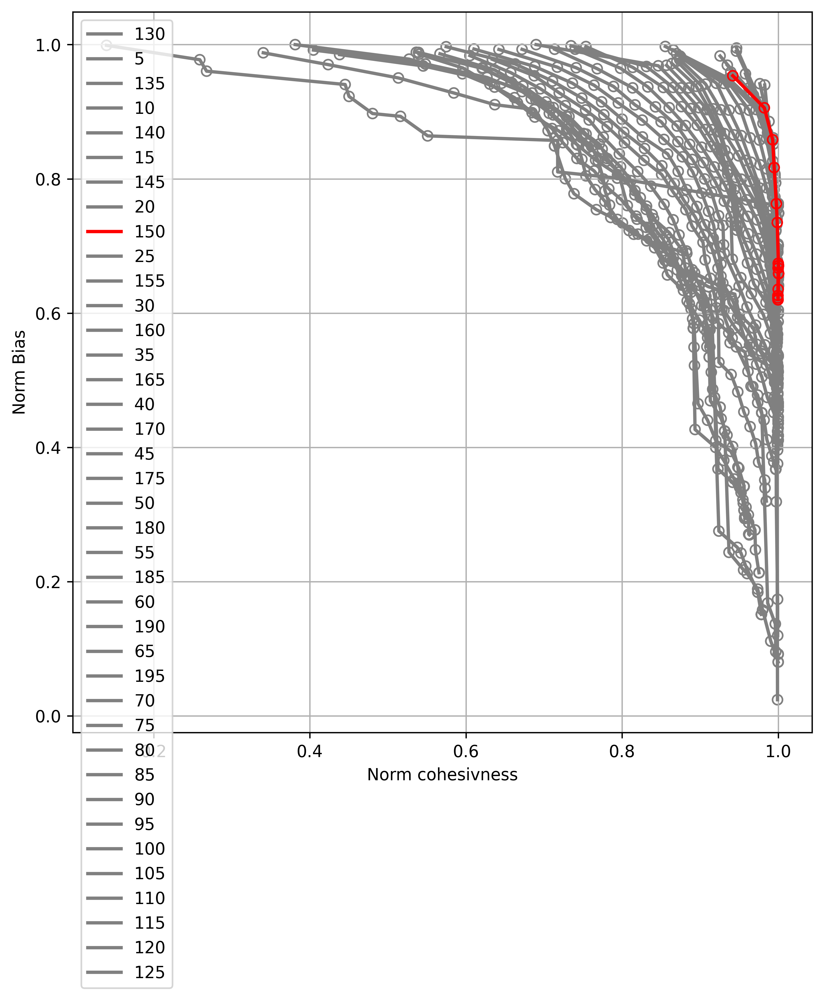

In [1014]:
fig, ax = plt.subplots(dpi=480, figsize=(8,8))
sizes = list(set(DF4["Size"].values))
for s in sizes:
    #if s % 10 != 0:
    #   continue
    tmp_df = DF4[DF4["Size"]==s]
    if s == 150:
        ax.scatter(tmp_df["NormCohe"], tmp_df["NormBias"], facecolors='none', 
           edgecolors='red', 
           alpha=1, zorder=100)
        ax.plot(tmp_df["NormCohe"], tmp_df["NormBias"], alpha=1, lw=2,
               label=s, color="red", zorder=100)

    else:
        ax.scatter(tmp_df["NormCohe"], tmp_df["NormBias"], facecolors='none', 
                   edgecolors='grey', 
                   alpha=1)
        ax.plot(tmp_df["NormCohe"], tmp_df["NormBias"], alpha=1, lw=2, color="grey",
               label=s)
#ax.scatter(max_cohe, max_bias, color="r", marker="o", s=55, zorder=100)
ax.grid(True)
#ax.set_xlim((0,1))
#ax.set_ylim((0,1))
ax.legend()
ax.set_xlabel("Norm cohesivness")
ax.set_ylabel("Norm Bias")

In [931]:
bestpoint = np.array((1, 1))
worstpoint = np.array((0, 0))
max_opt = 0
max_idx = 0
max_size = 0
max_STRs = None
max_cut = 0

opt_cut = 0.640
other_id = []
for i, row in DF4.iterrows():
    cohe, bias = row["NormCohe"], row["NormBias"]
    point = np.array((cohe, bias))
    dist1 = np.sqrt(np.sum(np.square(bestpoint-point)))
    dist2 = np.sqrt(np.sum(np.square(point-worstpoint)))
    opt = dist2/(dist1+dist2)
    #print(point, opt)
    #opt = dist2
    if opt >= max_opt:
        max_opt = opt
        max_size = row["Size"]
        max_cohe = cohe
        max_bias = bias
        max_cut = row["CutBias"]
        max_idx = i
    if opt > opt_cut:
        other_id.append(i)
print(max_idx, max_size, max_opt, (max_cohe, max_bias))
print(DF2.loc[max_idx,:])

655 50.0 0.5898872302175916 (0.34696133942537527, 0.8876924776162887)
Size        50.000000
Cohe         0.581703
CutBias      0.360000
Bias         0.361340
NormCohe     0.574153
NormBias     0.674734
Name: 655, dtype: float64


In [932]:
f = params_comp[(params_comp["Size"]==max_size)&
               (params_comp["minBias"]==max_cut)]["fname"].values[0]
cohe, real_minbias, STRs = LoadSA(f, DIR_comp)
print(cohe, real_minbias)
print(RegionDistributionsList(STRs))

0.581703123462934 0.3613396707503269
Striatum	2	Nucleus_accumbens; Caudoputamen
Thalamus	7	Nucleus_of_reuniens; Submedial_nucleus_of_the_thalamus; Mediodorsal_nucleus_of_thalamus; Lateral_posterior_nucleus_of_the_thalamus; Parataenial_nucleus; Anteromedial_nucleus_dorsal_part; Lateral_dorsal_nucleus_of_thalamus
Hippocampus	11	Field_CA1; Dentate_gyrus; Subiculum_ventral_part; Field_CA2; Field_CA3; Parasubiculum; Subiculum_dorsal_part; Presubiculum; Entorhinal_area_lateral_part; Postsubiculum; Entorhinal_area_medial_part_dorsal_zone
Isocortex	23	Prelimbic_area; Orbital_area_lateral_part; Infralimbic_area; Primary_somatosensory_area_lower_limb; Orbital_area_ventrolateral_part; Anteromedial_visual_area; Anterior_cingulate_area_dorsal_part; Primary_visual_area; Retrosplenial_area_lateral_agranular_part; Secondary_motor_area; Orbital_area_medial_part; Anterior_cingulate_area_ventral_part; Lateral_visual_area; Primary_somatosensory_area_trunk; Posterior_parietal_association_areas; Agranular_i